In [ ]:
!pip install scipy
!pip install matplotlib
!pip install pydmd
!pip install pykoopman
!pip install imageio
!pip install os
!pip install optht
!pip install derivative
!pip install lightning
!pip install imread
!pip install future
!pip install sphinx


import os
import matplotlib.pyplot as plt
import warnings
import scipy
import imageio
warnings.filterwarnings('ignore')

from pydmd import DMD
from matplotlib import animation
from IPython.display import HTML
import numpy as np
from os import listdir
import pykoopman as pk
import pandas as pd
from imread import imread

%matplotlib inline

import future
import sphinx

from sklearn.decomposition import PCA


from sklearn.preprocessing import StandardScaler
from pydmd import DMDc
from numpy.testing import assert_array_almost_equal

from numpy import linalg as LA
from pydmd import CDMD

from sklearn.datasets import fetch_openml
import sys
import cv2 as cv
import plotly.io as pio
import plotly.graph_objs as go
from PIL import Image
from skimage import color
from plotly import subplots
from sklearn.model_selection import train_test_split
pio.renderers.default = "colab"
from sklearn.decomposition import SparsePCA
import seaborn as sns

In [ ]:
from PIL import Image as im

In [ ]:
IMG_DIR = '/content/canoe'
X = []
X_flat = []
count = 1
size1 = 320
size2 = 240
total = 231
print("Loading...")
for img in sorted(os.listdir(IMG_DIR)):
    if count == total + 1:
        break
    sys.stdout.write("\r" + str(count) + " / " + str(total))
    sys.stdout.flush()
    img_array = cv.imread(os.path.join(IMG_DIR, img), cv.IMREAD_GRAYSCALE,)
    img_pil = Image.fromarray(img_array)
    img_156x120 = np.array(img_pil.resize((size1, size2), Image.ANTIALIAS))
    X.append(img_156x120)
    img_array = img_156x120.flatten()
    X_flat.append(img_array)
    count += 1
print()
print("Done!")

Loading...
231 / 231
Done!


In [ ]:
#visualizing some images
size = 5
count = 0
fig = subplots.make_subplots(rows = size, cols = size,
                 vertical_spacing = 0.06, horizontal_spacing = 0.02)
for row in range(size):
  for col in range(size):
    fig.add_trace(go.Image(z = color.gray2rgb(X[count])),
                  row = row + 1, col = col + 1)
    count += 1
fig["layout"].update(title = "Anime Images", template = "plotly_dark", height = 900)
fig.show()

In [ ]:
X_flat = np.asarray(X_flat)
X_flat.shape

(231, 76800)

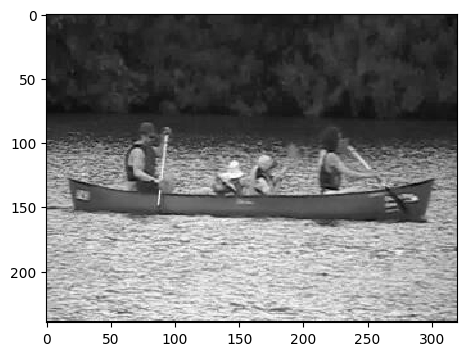

In [ ]:
images_dir = '/content/test'
plt.figure(figsize=(8,4));
plt.imshow(X_flat[115].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
plt.savefig(f"{images_dir}/label{[115]}.png")

In [ ]:
pca = PCA(n_components=total)
PC = pca.fit_transform(X_flat)
eigenvalues = pca.explained_variance_
explained_variance_ratio = pca.explained_variance_ratio_

time: 11.8 s (started: 2023-09-04 17:00:06 +00:00)


In [ ]:
PC.shape

(231, 93)

time: 3.54 ms (started: 2023-09-04 16:49:02 +00:00)


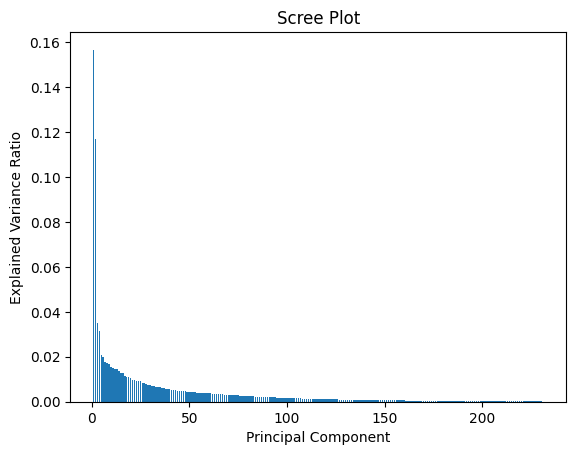

PC	Explained Variance Ratio	Cumulative Explained Variance Ratio
1.0	0.15667434166182578	0.15667434166182578
2.0	0.11699303740709609	0.27366737906892186
3.0	0.03497322402534237	0.3086406030942642
4.0	0.031689350916980226	0.34032995401124444
5.0	0.02079564767041182	0.36112560168165625
6.0	0.019728822618259284	0.38085442429991556
7.0	0.01785170746221647	0.39870613176213204
8.0	0.017134086689236216	0.41584021845136826
9.0	0.016779618210261703	0.43261983666162995
10.0	0.015283223972939696	0.44790306063456964
11.0	0.0149301802670555	0.46283324090162514
12.0	0.014721255316860492	0.4775544962184856
13.0	0.01434768878844658	0.49190218500693217
14.0	0.013801330240085723	0.5057035152470178
15.0	0.012641915038677048	0.5183454302856949
16.0	0.012574705582998285	0.5309201358686932
17.0	0.011629920128942775	0.5425500559976361
18.0	0.010903090916385642	0.5534531469140217
19.0	0.010827644741147219	0.5642807916551689
20.0	0.010576187169009576	0.5748569788241784
21.0	0.009816327266406907	0.58467330609058

In [ ]:
num_components = len(explained_variance_ratio)
plt.bar(range(1, num_components + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Scree Plot')
plt.show()

# Summary table
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)
summary_table = np.column_stack((range(1, num_components + 1), explained_variance_ratio, cumulative_explained_variance_ratio))
print('PC\tExplained Variance Ratio\tCumulative Explained Variance Ratio')
for row in summary_table:
    print('\t'.join(str(x) for x in row))

In [ ]:
snapshots_matrix = PC.T
random_matrix = np.random.permutation(
    snapshots_matrix.shape[0] * snapshots_matrix.shape[1]
)
random_matrix = random_matrix.reshape(
    snapshots_matrix.shape[1], snapshots_matrix.shape[0]
)

compression_matrix = random_matrix / np.linalg.norm(random_matrix)

In [ ]:
cdmd = CDMD(svd_rank=231, compression_matrix=compression_matrix)
cdmd.fit(snapshots_matrix)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(cdmd.modes.real)
plt.subplot(1, 2, 2)
plt.plot(cdmd.dynamics.T.real)
plt.show()

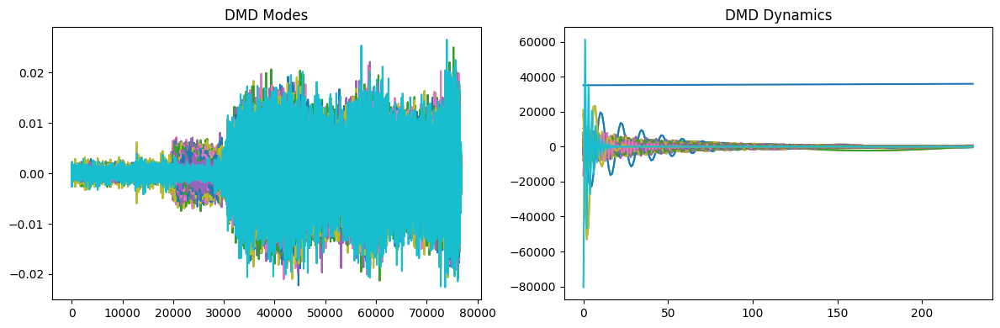

In [ ]:
Z = X_flat.T

# Perform DMD
dmd = DMD(svd_rank=231)
dmd.fit(Z)

# Access DMD modes and dynamics
modes = dmd.modes.T
dynamics = dmd.dynamics

# Visualize DMD modes and dynamics
plt.figure(figsize=(12, 4))

# Plot DMD modes
plt.subplot(1, 2, 1)
for mode in modes:
    plt.plot(mode)
plt.title('DMD Modes')

# Plot DMD dynamics
plt.subplot(1, 2, 2)
for dynamic in dynamics:
    plt.plot(dynamic)
plt.title('DMD Dynamics')

plt.tight_layout()
plt.show()

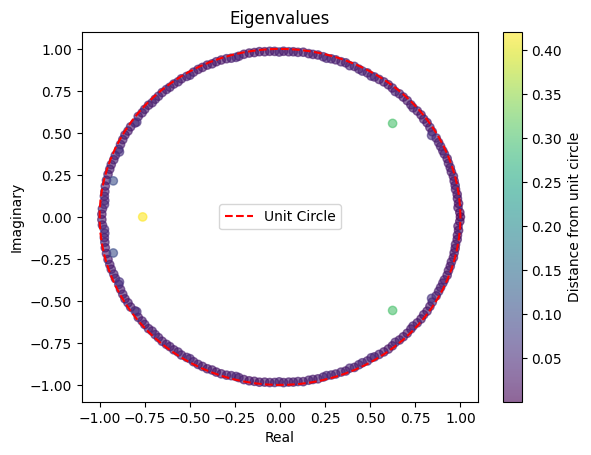

In [ ]:
eigenvalues = dmd.eigs

# Calculate distance from unit circle
distances = np.abs(eigenvalues.imag**2 + eigenvalues.real**2 - 1)

# Plot eigenvalues and unit circle
plt.figure()
plt.scatter(eigenvalues.real, eigenvalues.imag, c=distances, cmap='viridis', alpha=0.6)
plt.colorbar(label='Distance from unit circle')
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.title('Eigenvalues')

# Plot unit circle
theta = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(theta), np.sin(theta), color='red', linestyle='--', label='Unit Circle')
plt.legend()

plt.show()

In [ ]:
def explainedVariance(percentage, images):
    # percentage should be a decimal from 0 to 1
    pca = PCA(percentage)
    pca.fit(images)
    PC = pca.transform(images)
    snapshots_matrix = PC.T
    random_matrix = np.random.permutation(
      snapshots_matrix.shape[0] * snapshots_matrix.shape[1]
    )
    random_matrix = random_matrix.reshape(
      snapshots_matrix.shape[1], snapshots_matrix.shape[0]
    )

    compression_matrix = random_matrix / np.linalg.norm(random_matrix)

    cdmd = CDMD(svd_rank=231, compression_matrix=compression_matrix)
    cdmd.fit(snapshots_matrix)
    approxOriginal = pca.inverse_transform(cdmd.reconstructed_data.T)
    approxOriginal = approxOriginal.T.astype(np.float)
    return approxOriginal

In [ ]:
x = explainedVariance(0.9999, X_flat)
x.shape

(76800, 231)

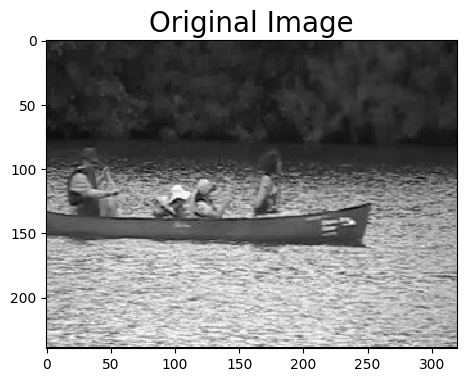

In [ ]:
plt.figure(figsize=(8,4));
plt.imshow(X_flat[95].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
plt.xlabel('', fontsize = 14)
plt.title('Original Image', fontsize = 20);

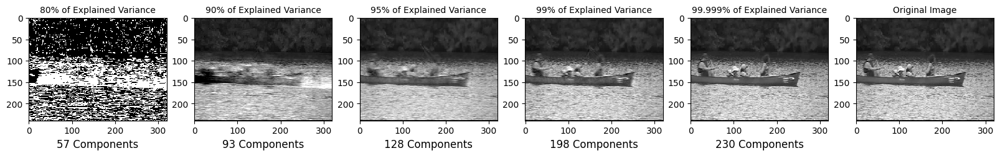

In [ ]:
plt.figure(figsize=(20,4));

plt.subplot(1, 6, 1);
plt.imshow(explainedVariance(.80, X_flat).T[95].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
plt.xlabel('57 Components', fontsize = 12)
plt.title('80% of Explained Variance', fontsize = 10);

# 154 principal components
plt.subplot(1, 6, 2);
plt.imshow(explainedVariance(.9, X_flat).T[95].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
plt.xlabel('93 Components', fontsize = 12)
plt.title('90% of Explained Variance', fontsize = 10);

plt.subplot(1, 6, 3);
plt.imshow(explainedVariance(.95, X_flat).T[95].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
plt.xlabel('128 Components', fontsize = 12)
plt.title('95% of Explained Variance', fontsize = 10);

plt.subplot(1, 6, 4);
plt.imshow(explainedVariance(.99, X_flat).T[95].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
plt.xlabel('198 Components', fontsize = 12)
plt.title('99% of Explained Variance', fontsize = 10);

plt.subplot(1, 6, 5);
plt.imshow(explainedVariance(.99999, X_flat).T[95].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
plt.xlabel('230 Components', fontsize = 12)
plt.title('99.999% of Explained Variance', fontsize = 10);

# Original Image
plt.subplot(1, 6, 6);
plt.imshow(X_flat[95].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
plt.xlabel('', fontsize = 14)
plt.title('Original Image', fontsize = 10);

In [ ]:
approximate = pca.inverse_transform(dmd.reconstructed_data.T)
#approximate = dmd.reconstructed_data.T
approximate = approximate.astype(np.float)
approximate.shape

(231, 76800)

In [ ]:
approx_vid = []
i = 0
total = 231

for i in range(0, 231, 1):
    if i == total + 1:
       break
    images_dir = '/content/Canoe90'
    plt.figure(figsize=(8,4));
    plt.imshow(approximate[i].reshape(240, 320),
              cmap = plt.cm.gray, interpolation='nearest',
              clim=(0, 255));
    plt.savefig(f"{images_dir}/label{[i]}.png")
    #plt.savefig('approximate[i].png')



In [ ]:
import shutil
shutil.make_archive('/content/test', 'zip', '/content/test')

'/content/test.zip'

In [ ]:
import timeit
import psutil

!pip install ipython-autotime
%load_ext autotime

!pip install memory_profiler
from memory_profiler import memory_usage

[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


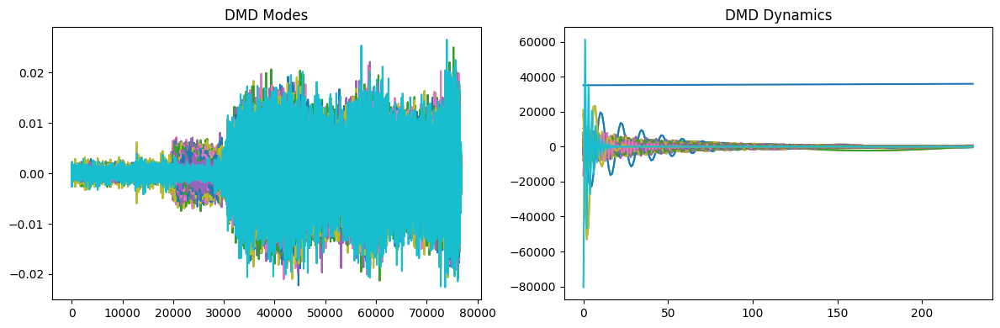

Repetition: 1
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


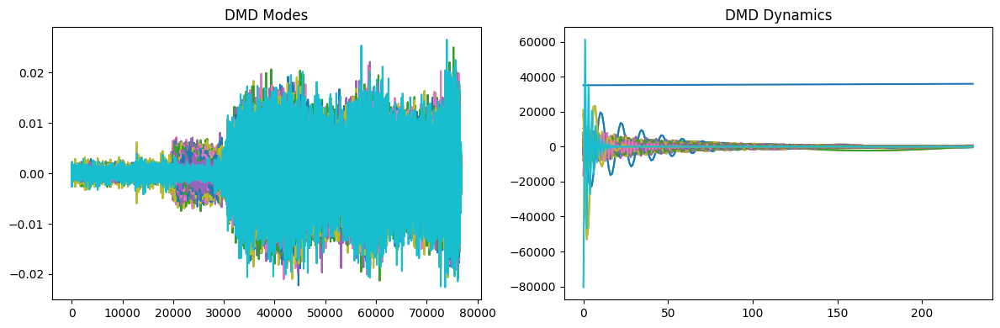

Repetition: 2
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


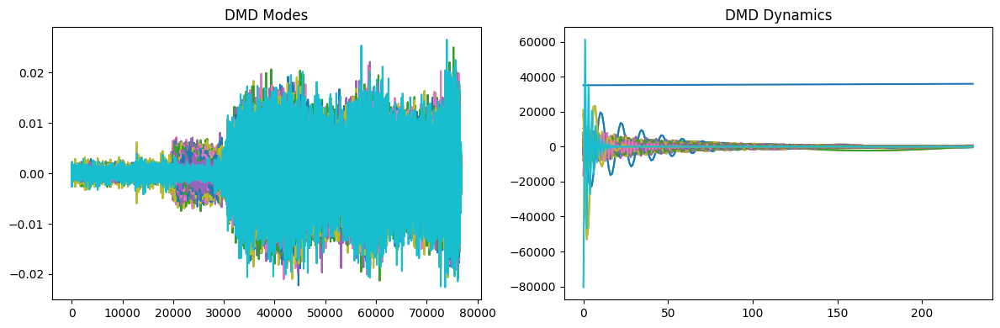

Repetition: 3
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


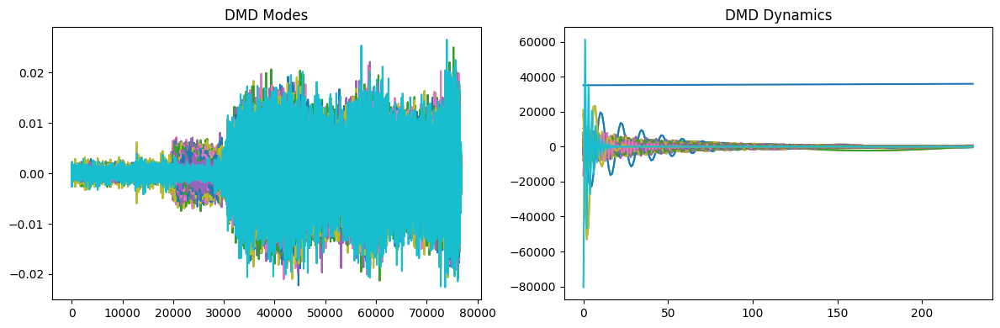

Repetition: 4
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


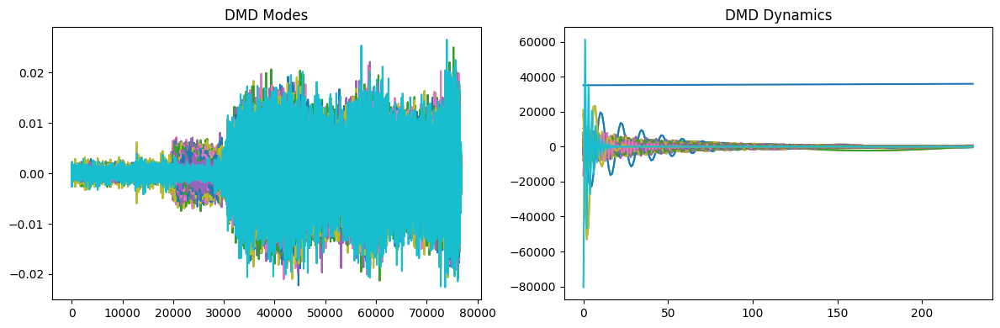

Repetition: 5
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


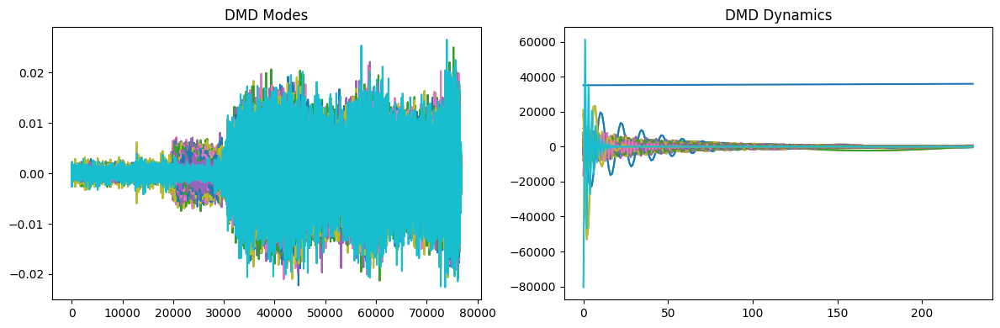

Repetition: 6
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


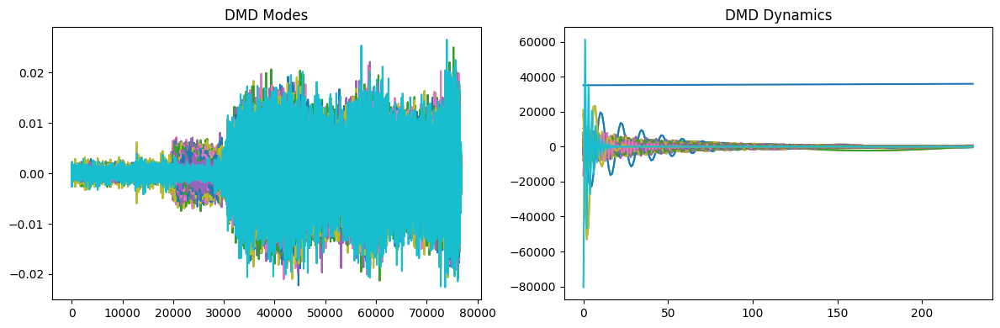

Repetition: 7
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


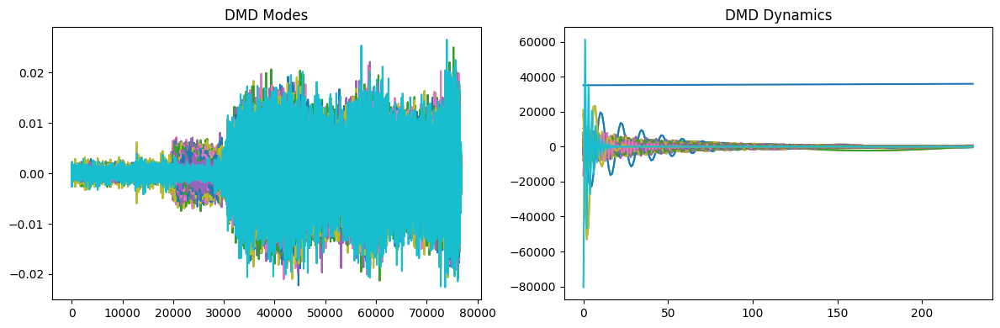

Repetition: 8
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


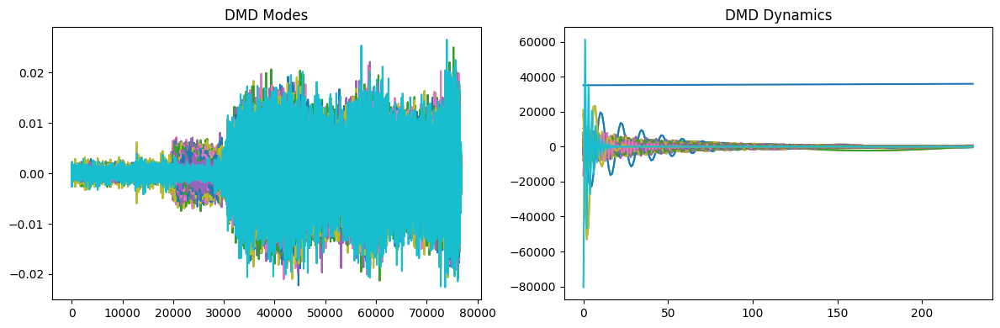

Repetition: 9
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


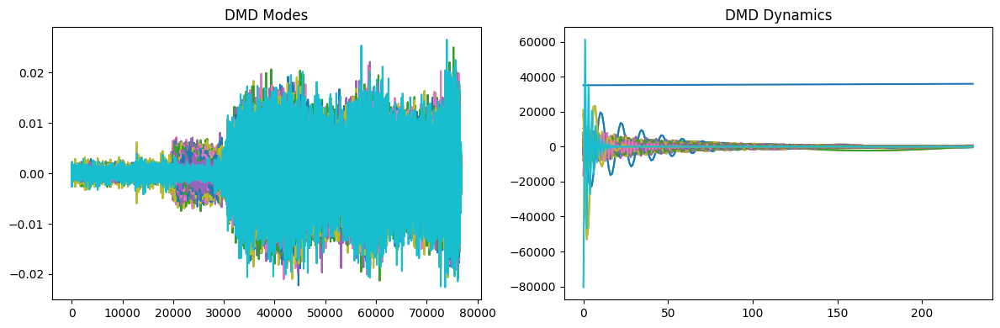

Repetition: 10
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


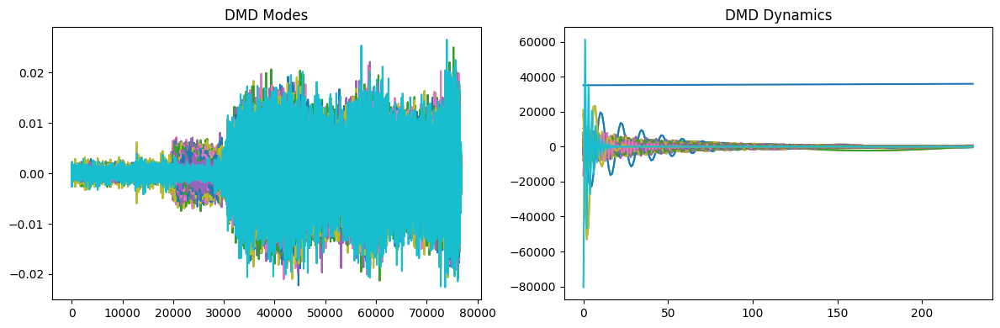

Repetition: 11
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


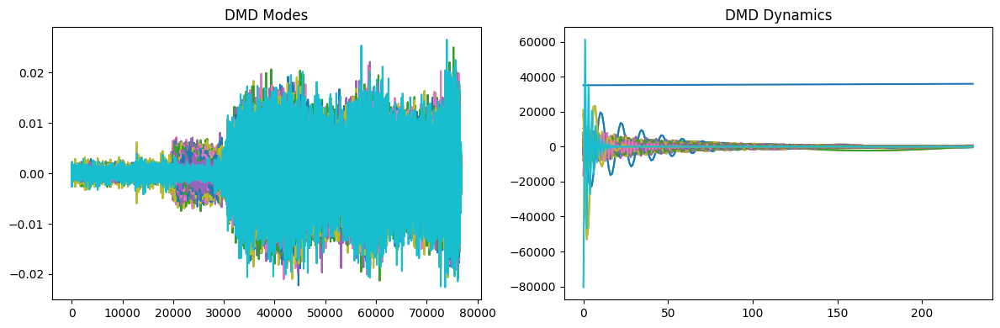

Repetition: 12
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


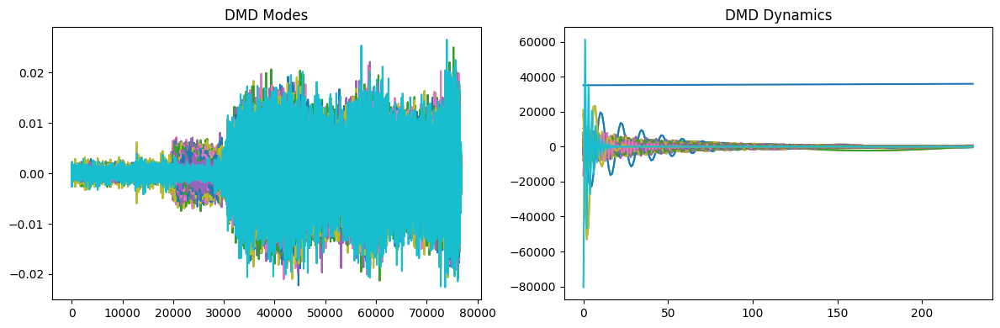

Repetition: 13
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


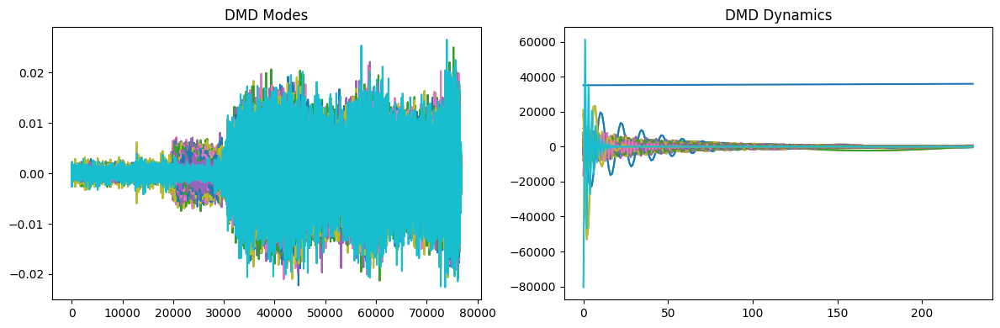

Repetition: 14
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


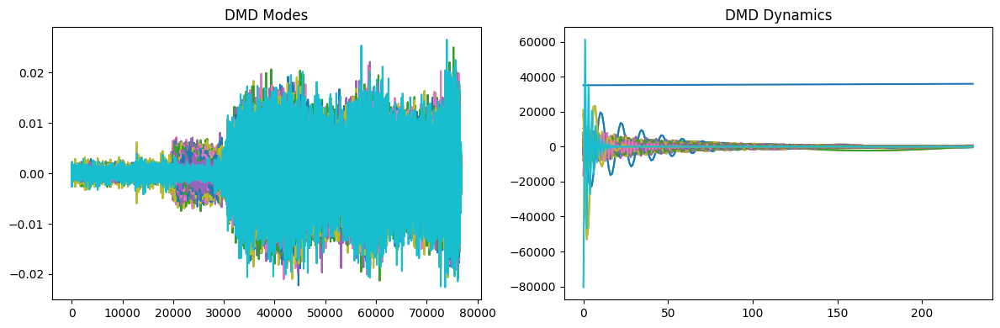

Repetition: 15
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


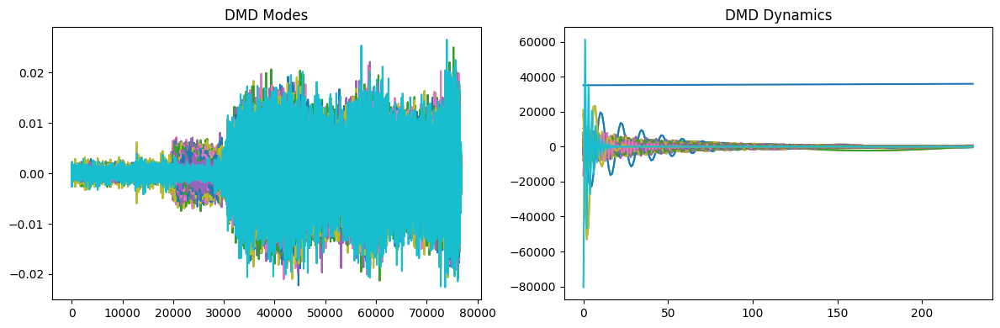

Repetition: 16
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


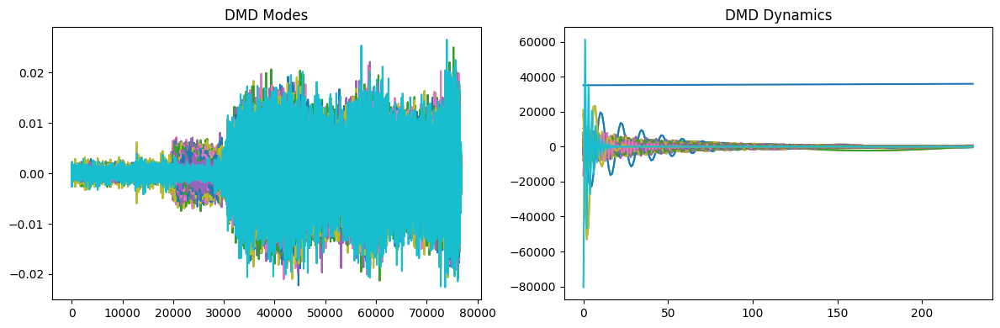

Repetition: 17
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


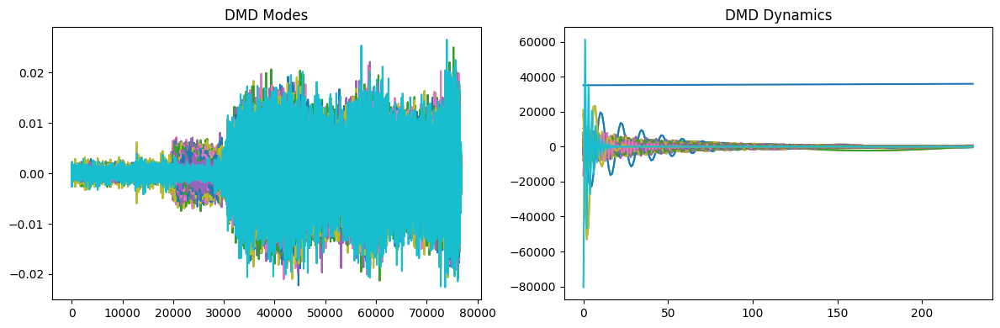

Repetition: 18
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


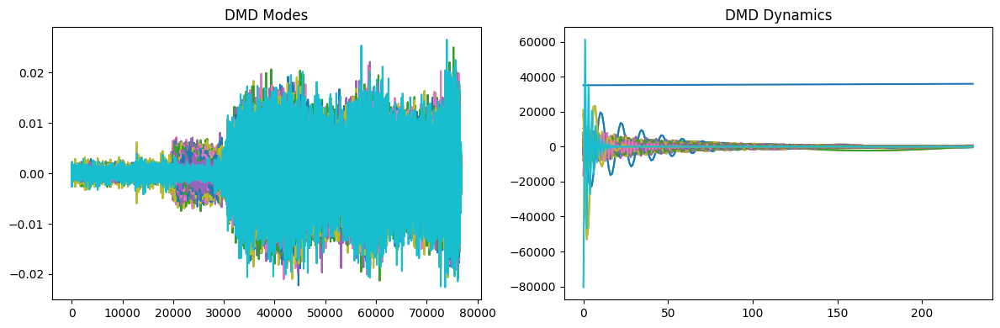

Repetition: 19
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


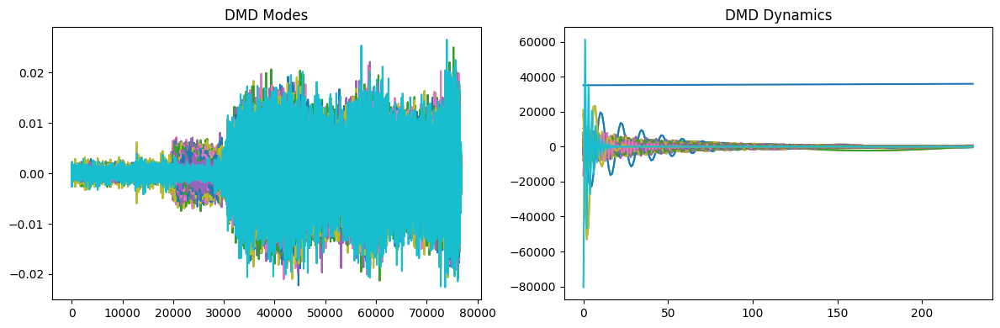

Repetition: 20
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


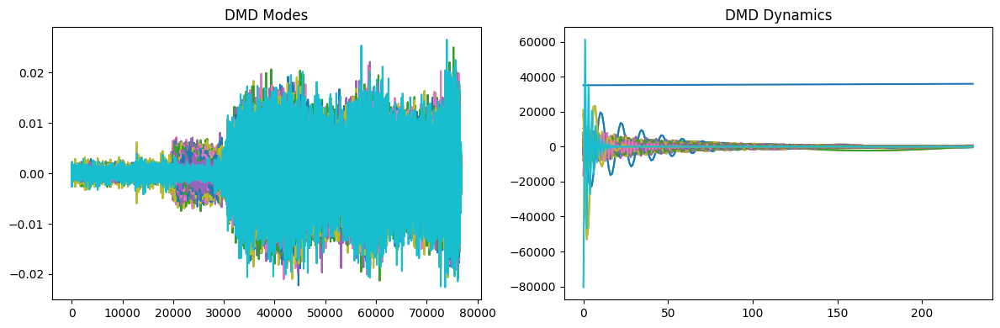

Repetition: 21
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


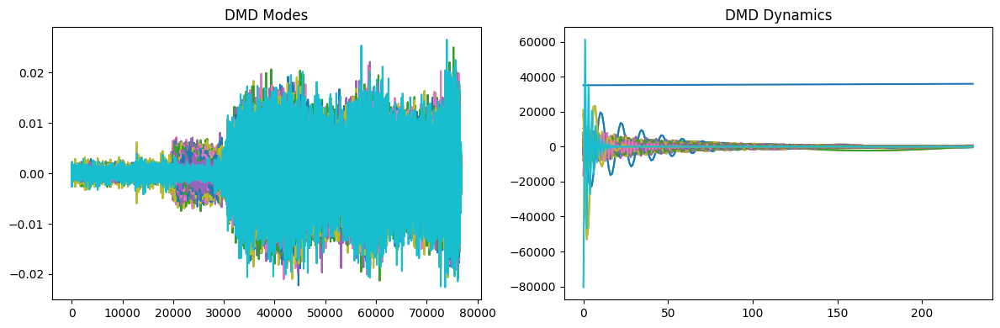

Repetition: 22
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


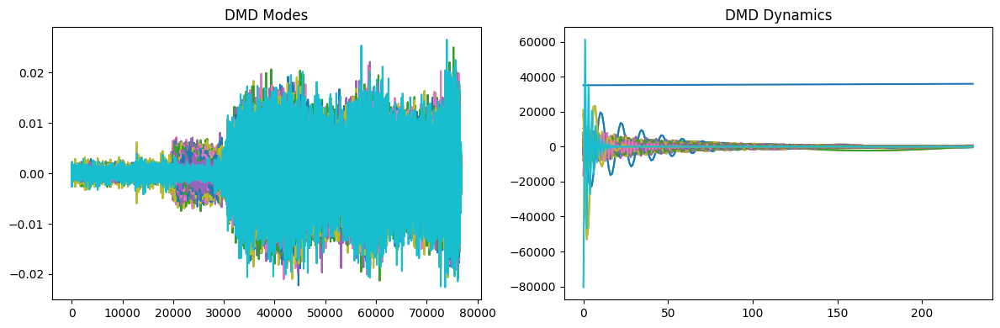

Repetition: 23
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


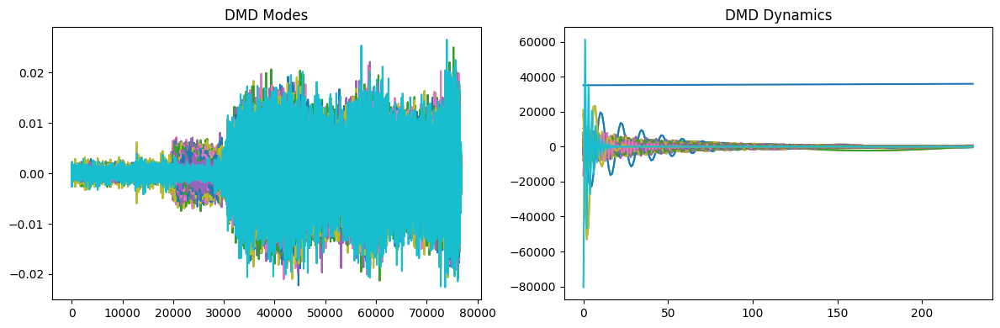

Repetition: 24
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


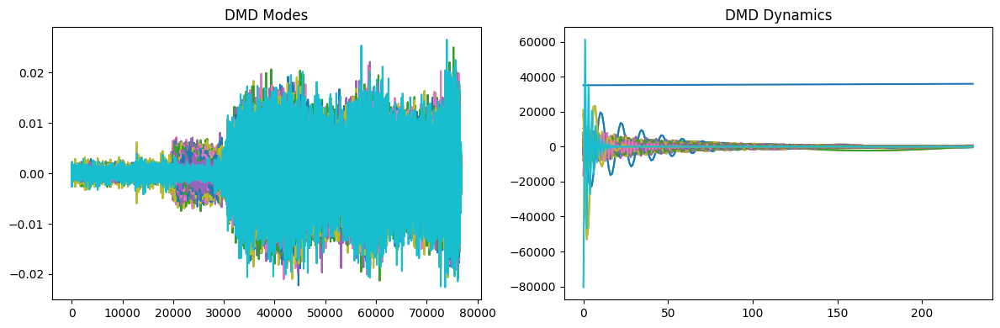

Repetition: 25
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


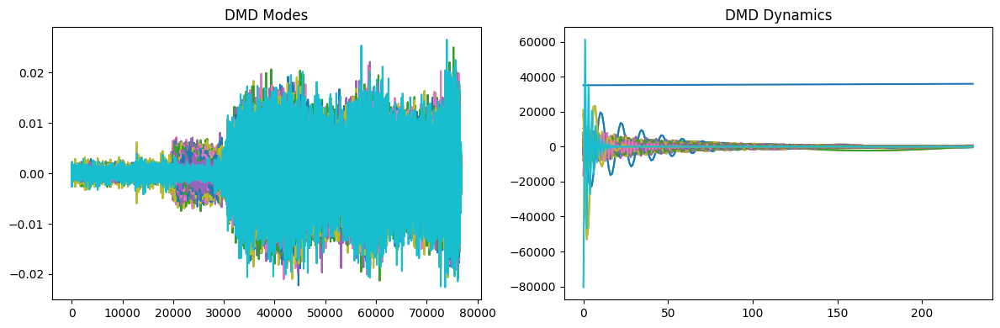

Repetition: 26
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


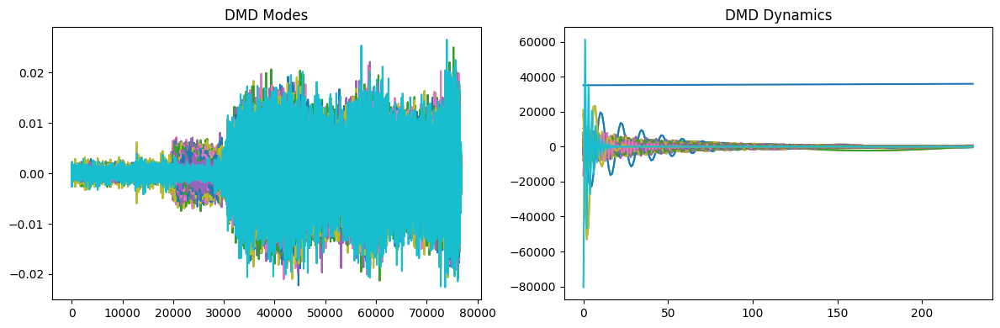

Repetition: 27
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


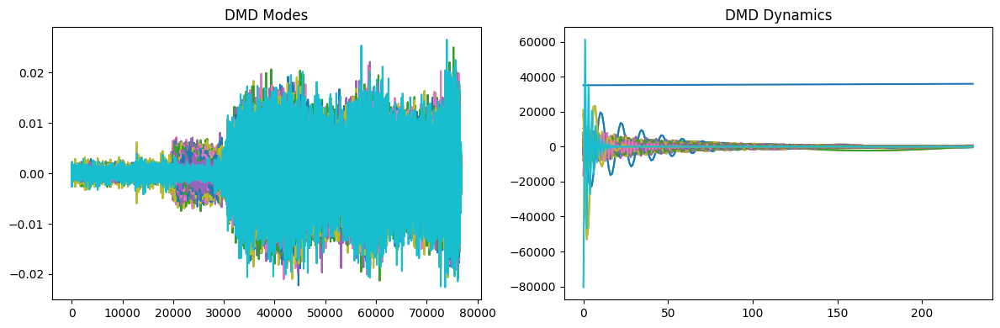

Repetition: 28
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


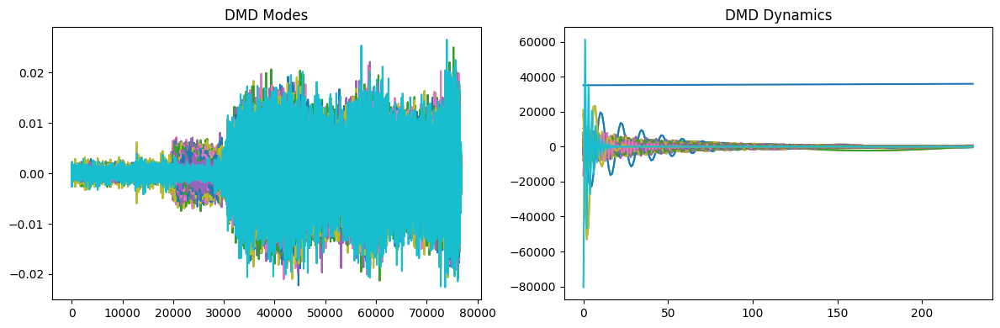

Repetition: 29
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


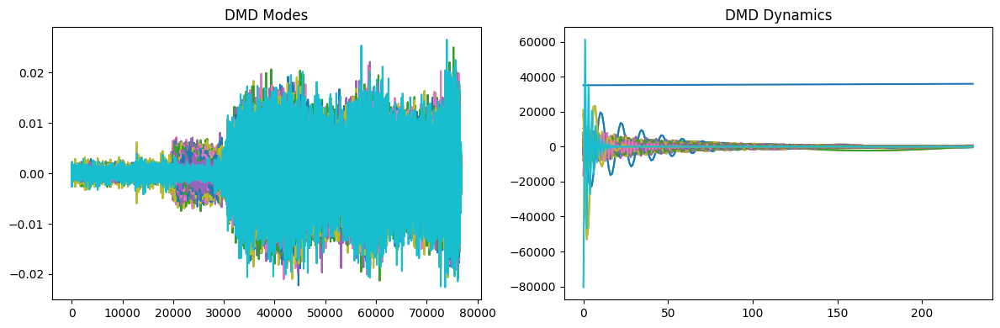

Repetition: 30
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


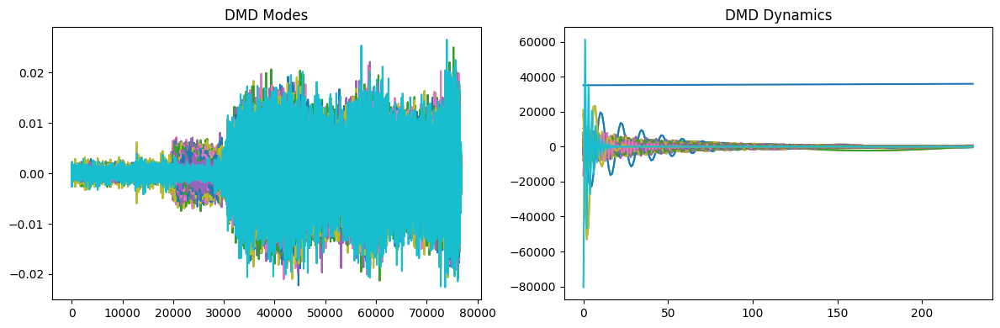

Repetition: 31
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


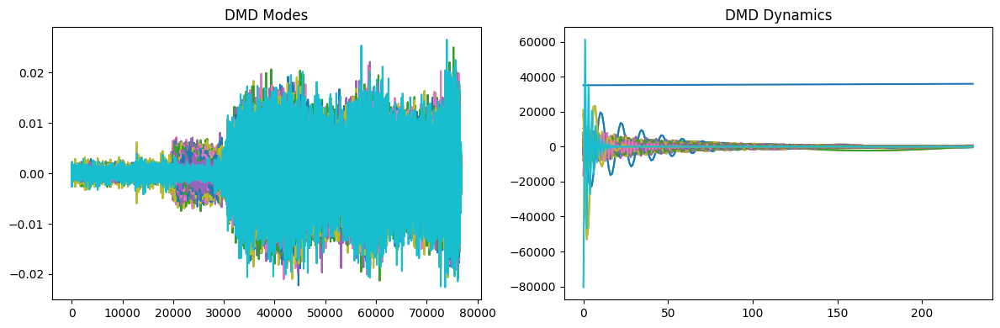

Repetition: 32
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


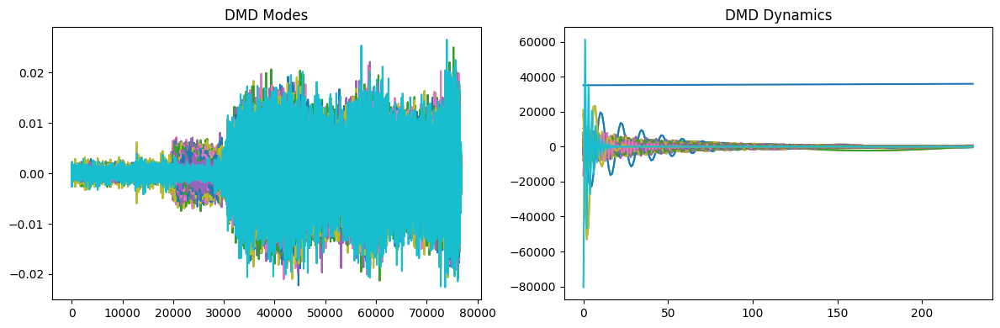

Repetition: 33
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


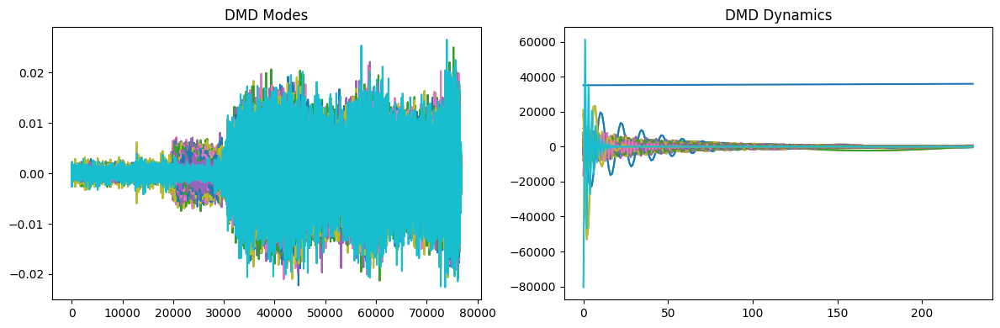

Repetition: 34
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


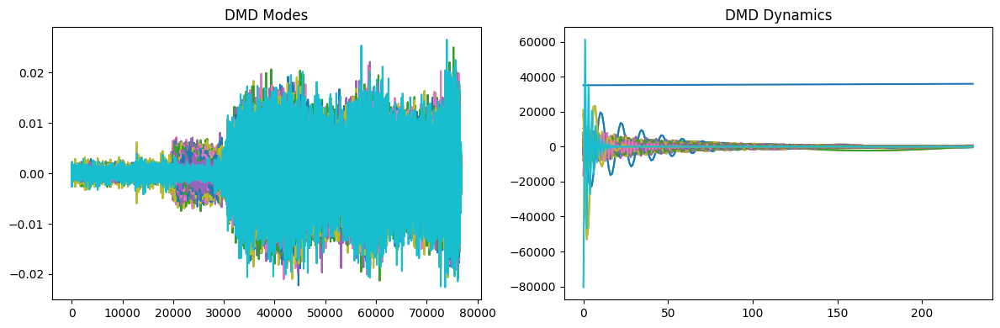

Repetition: 35
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


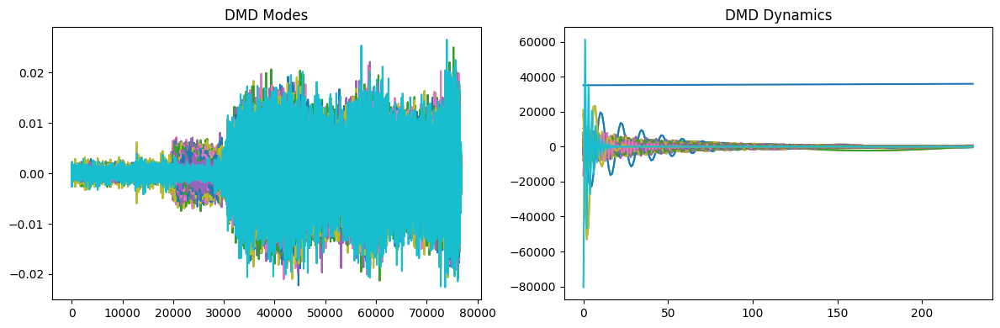

Repetition: 36
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


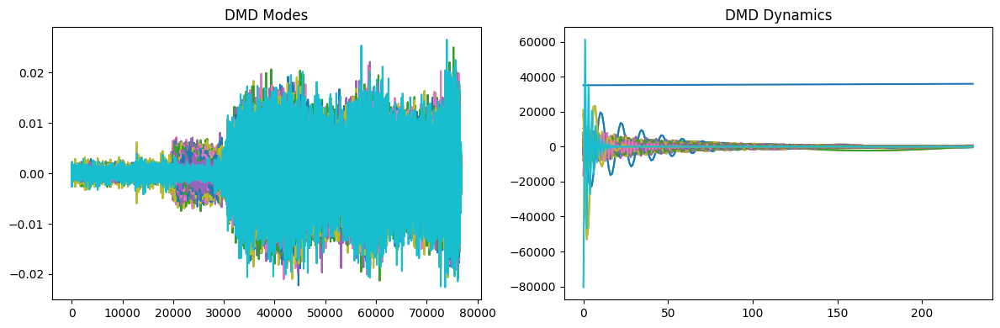

Repetition: 37
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


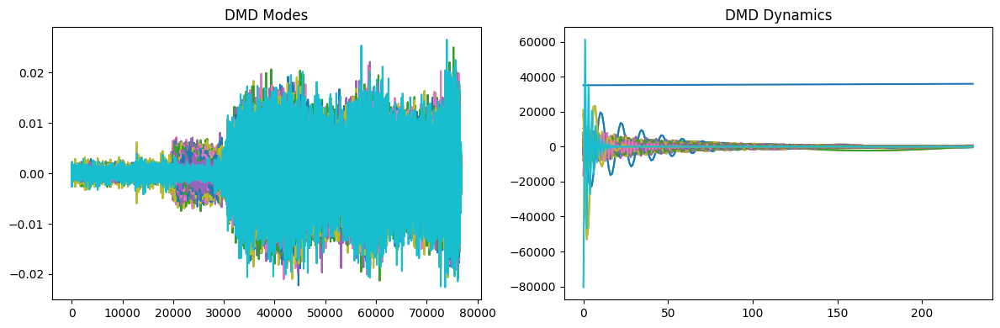

Repetition: 38
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


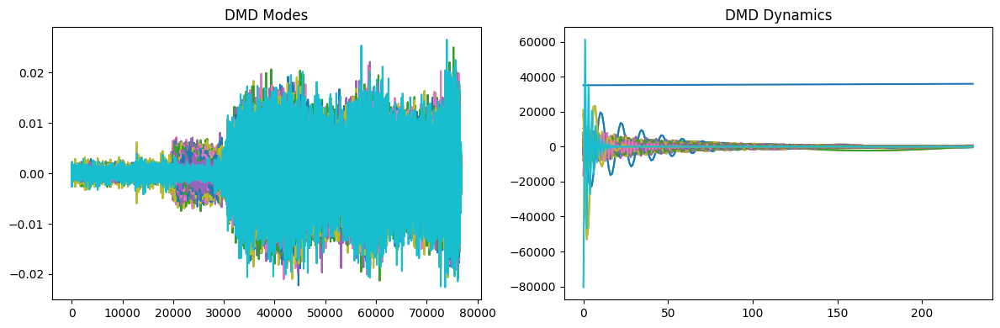

Repetition: 39
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


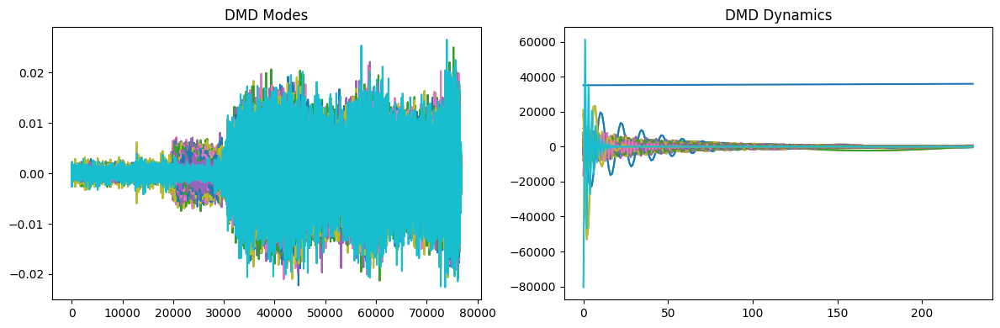

Repetition: 40
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


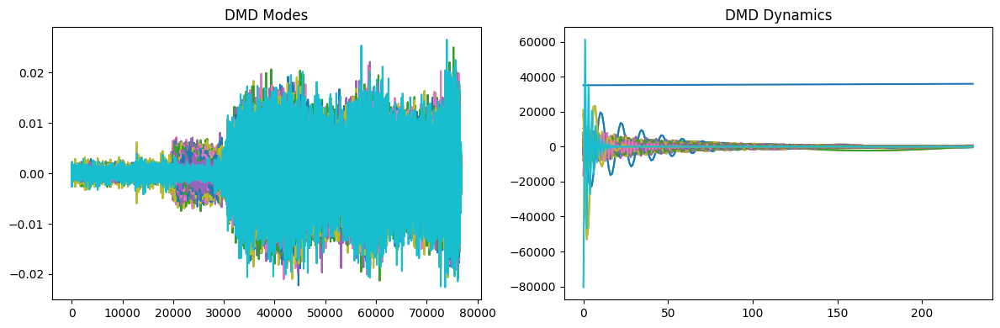

Repetition: 41
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


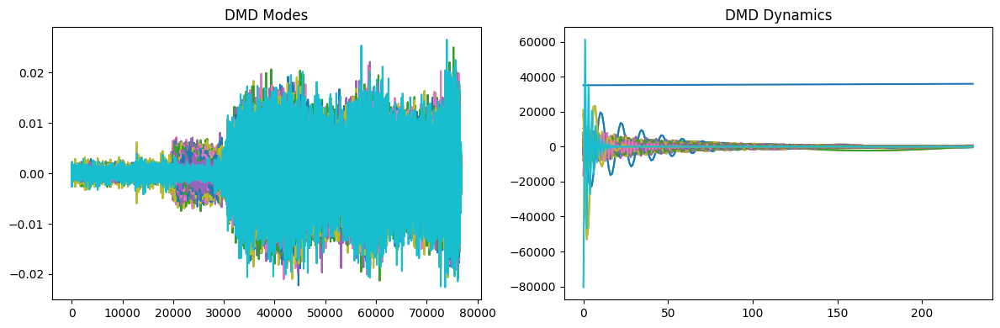

Repetition: 42
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


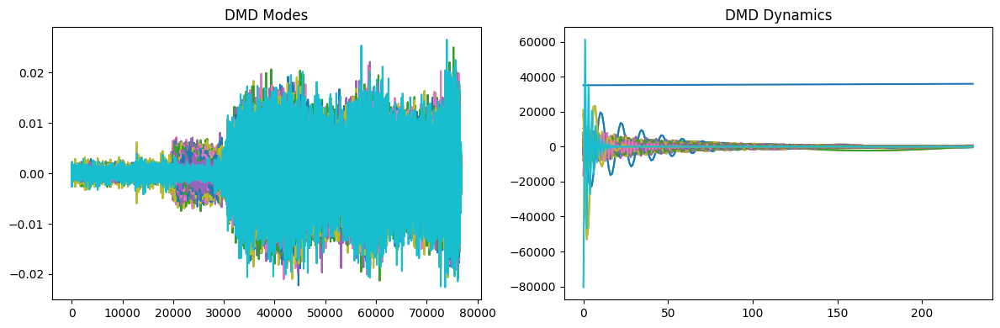

Repetition: 43
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


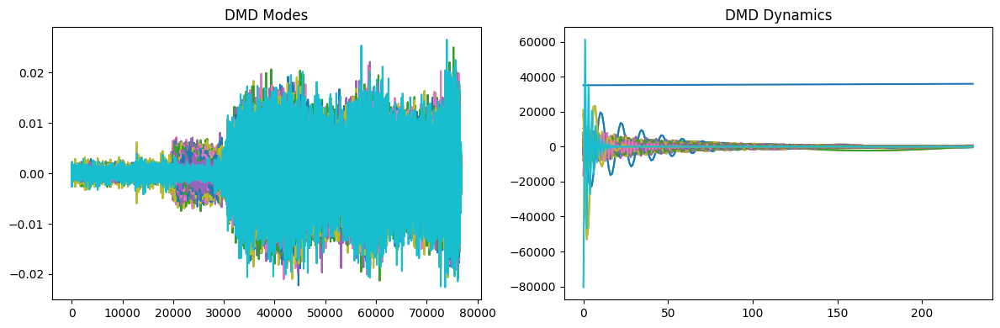

Repetition: 44
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


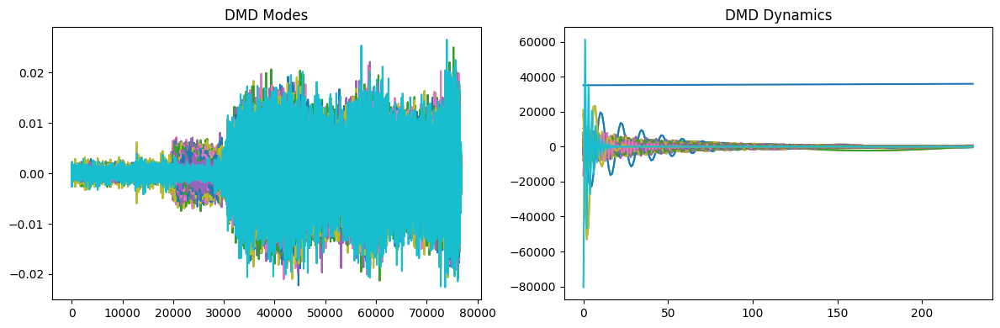

Repetition: 45
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


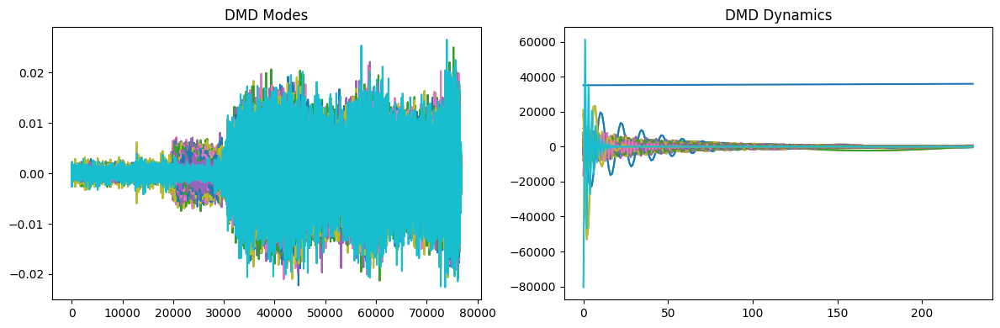

Repetition: 46
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


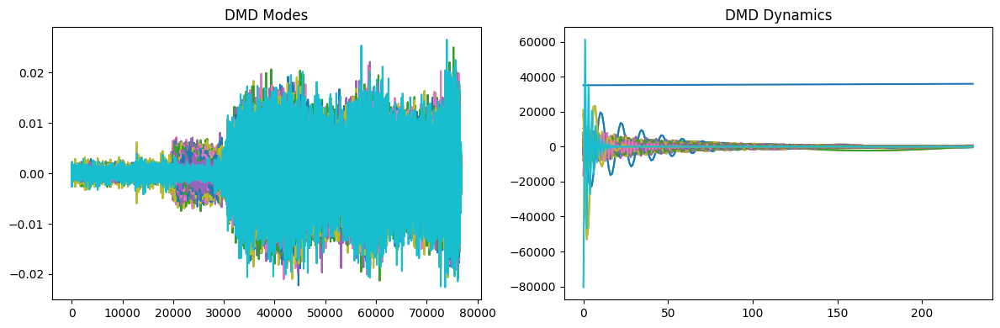

Repetition: 47
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


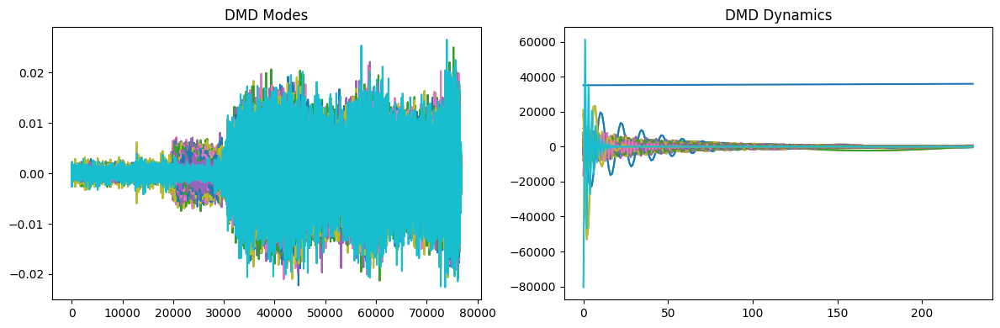

Repetition: 48
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


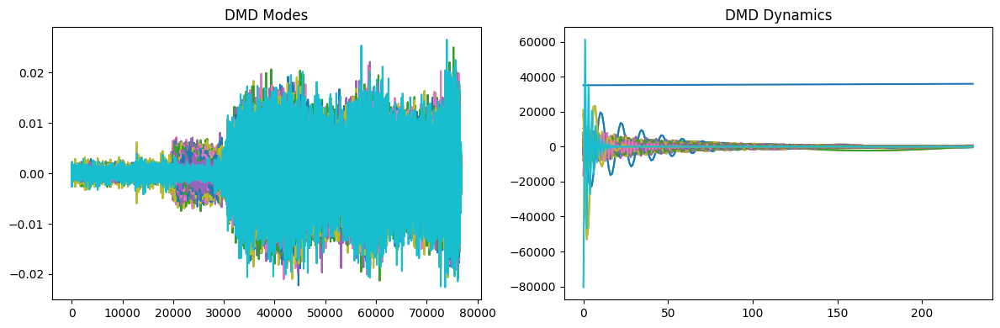

Repetition: 49
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


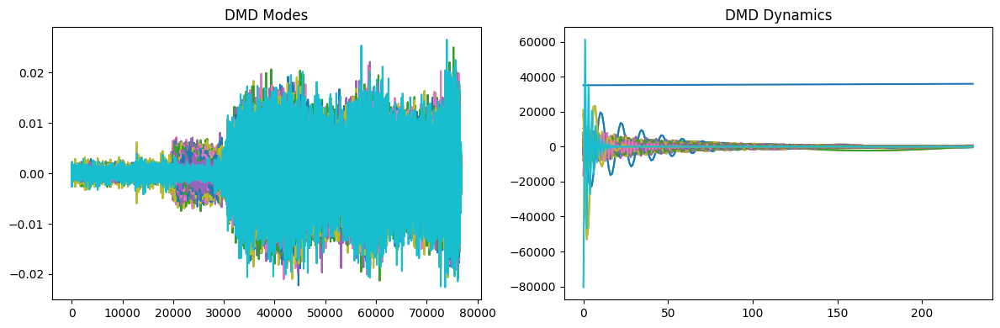

Repetition: 50
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


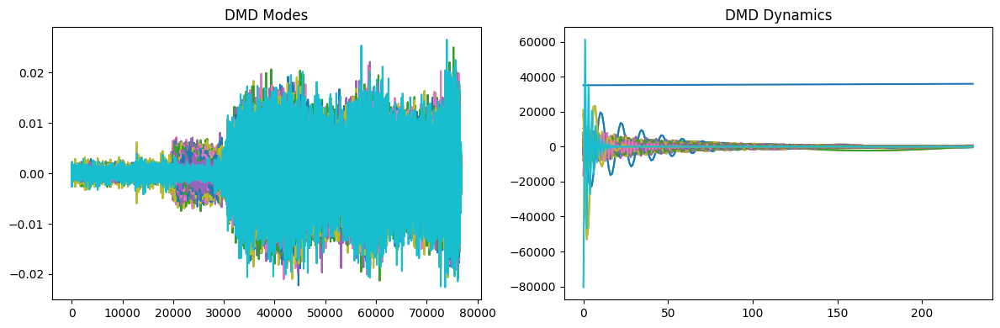

Repetition: 51
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


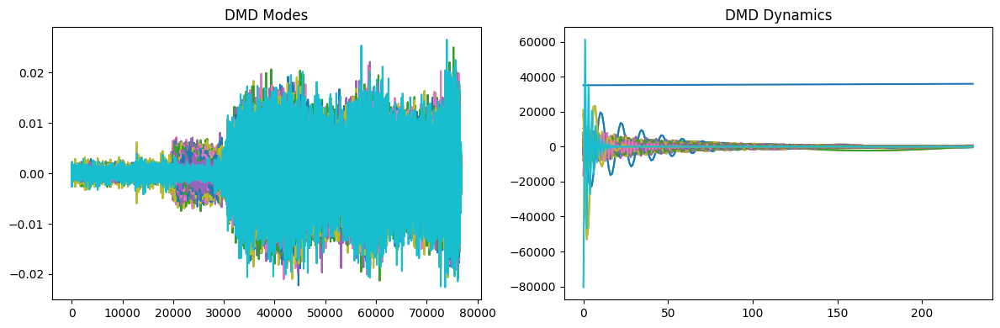

Repetition: 52
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


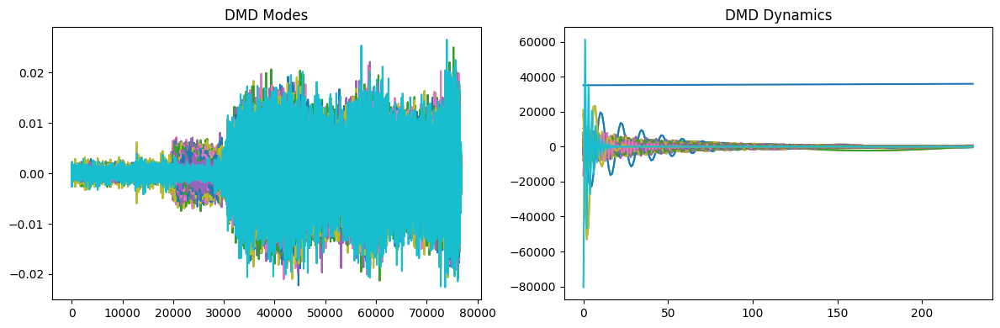

Repetition: 53
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


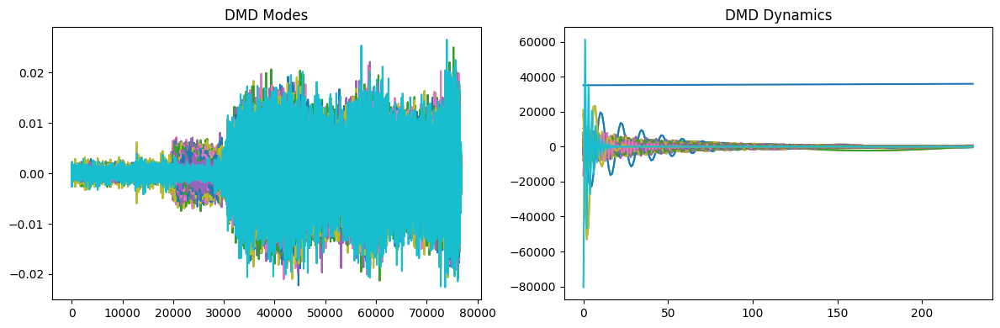

Repetition: 54
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


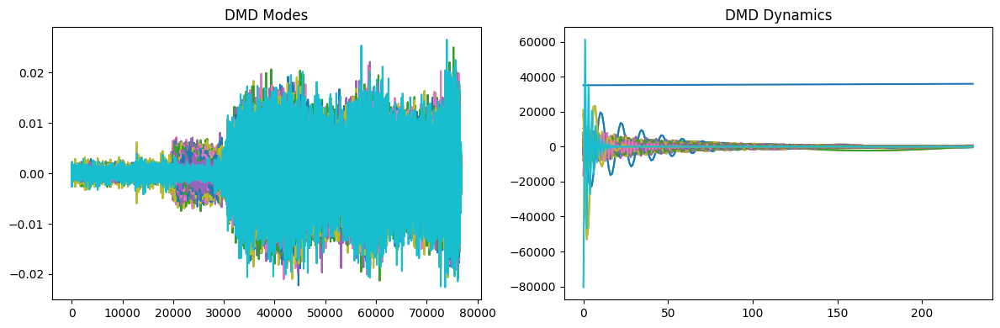

Repetition: 55
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


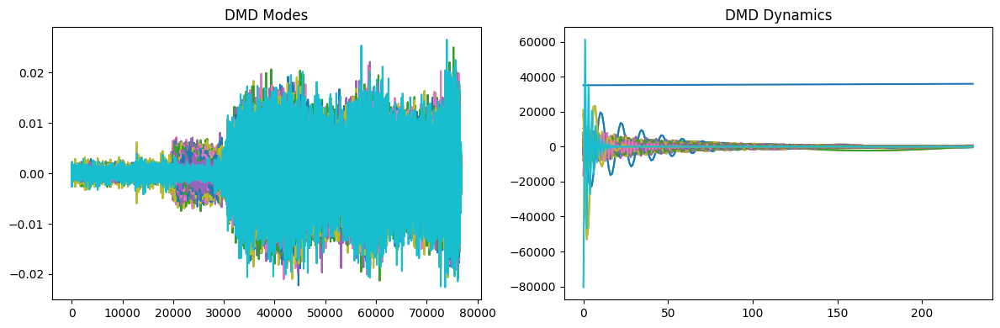

Repetition: 56
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


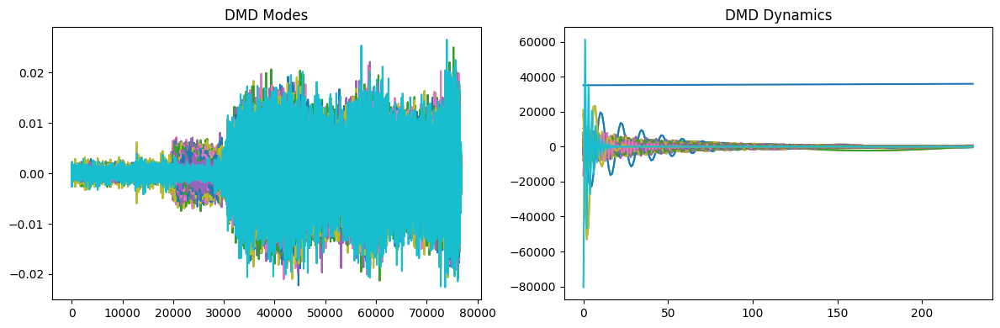

Repetition: 57
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


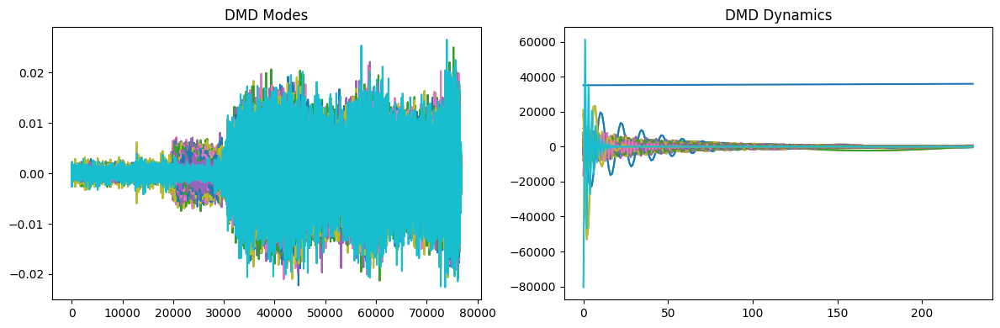

Repetition: 58
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


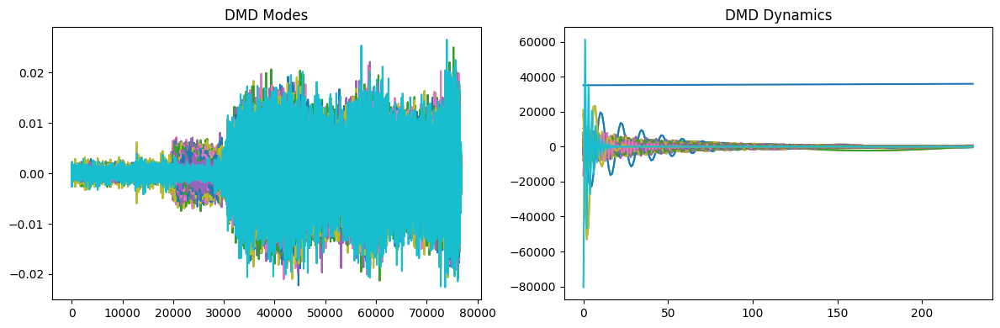

Repetition: 59
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


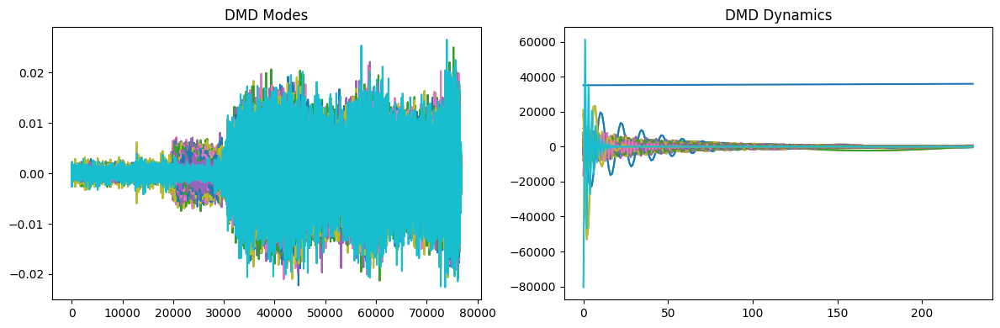

Repetition: 60
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


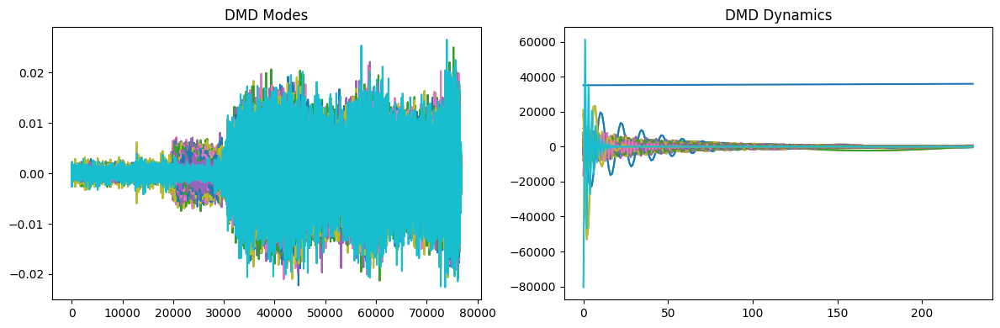

Repetition: 61
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


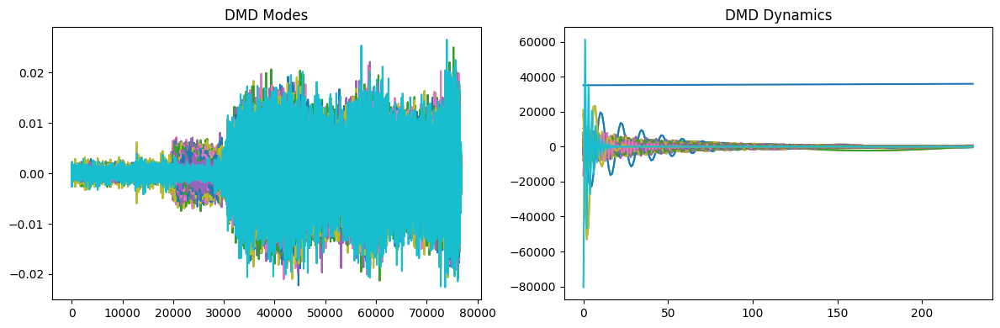

Repetition: 62
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


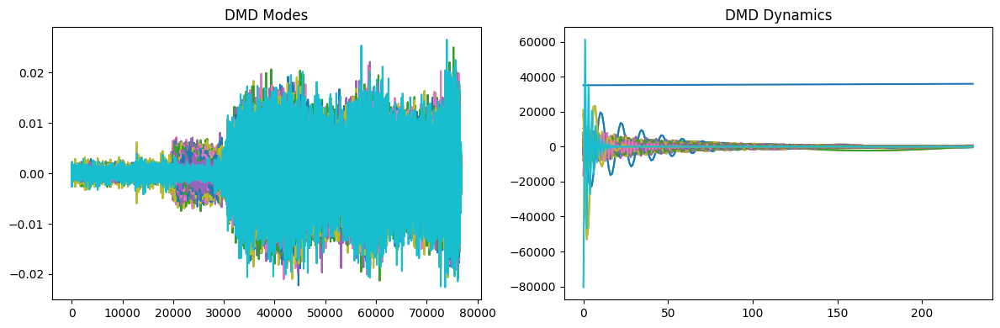

Repetition: 63
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


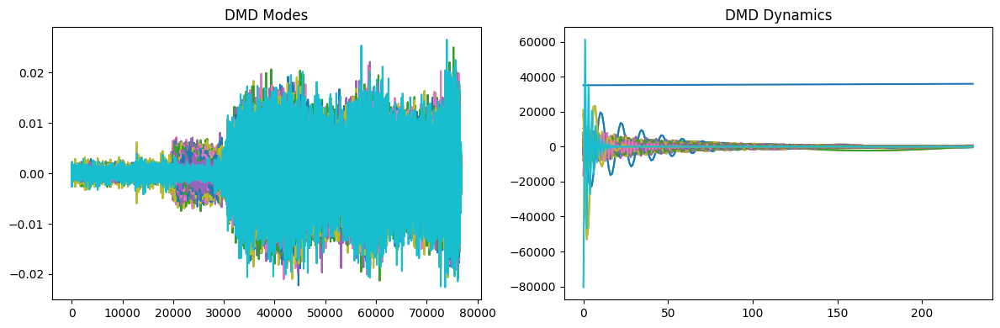

Repetition: 64
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


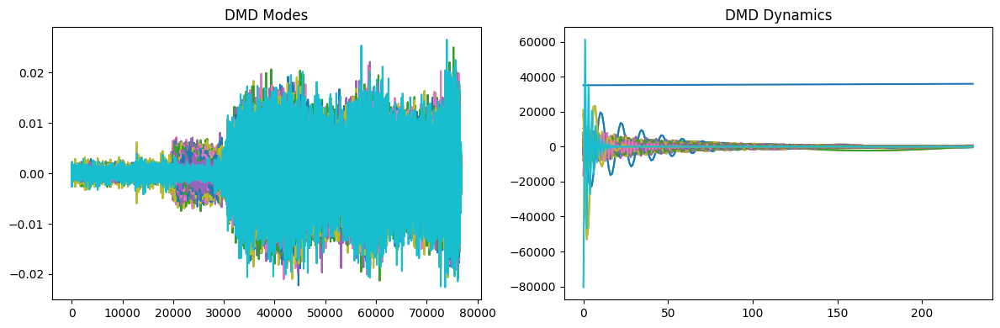

Repetition: 65
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


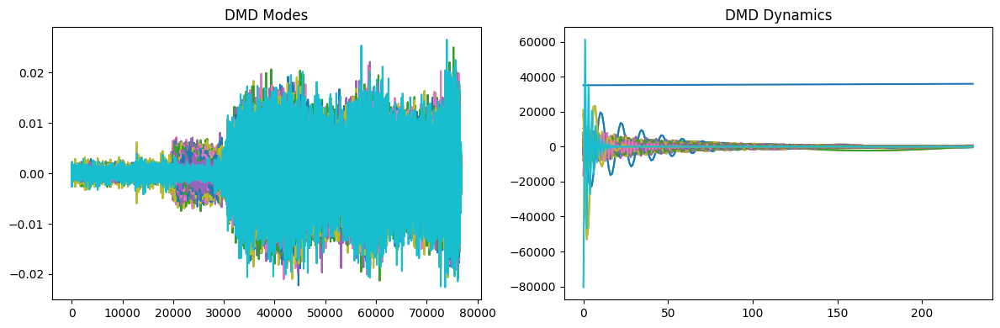

Repetition: 66
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


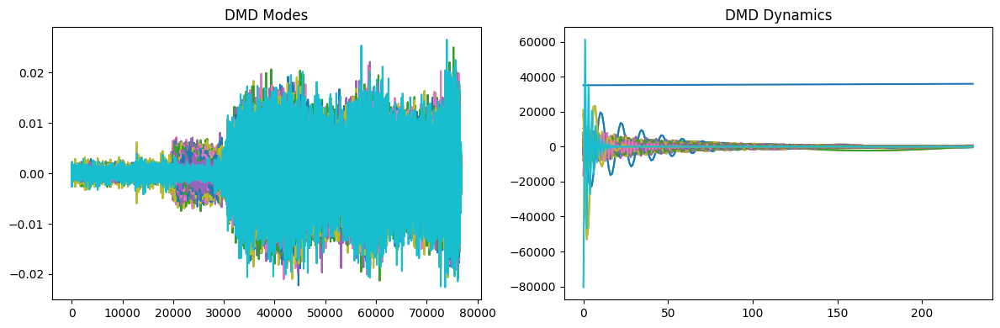

Repetition: 67
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


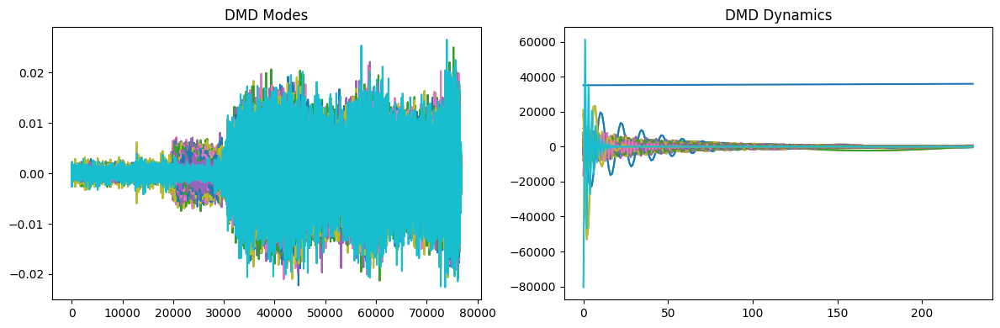

Repetition: 68
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


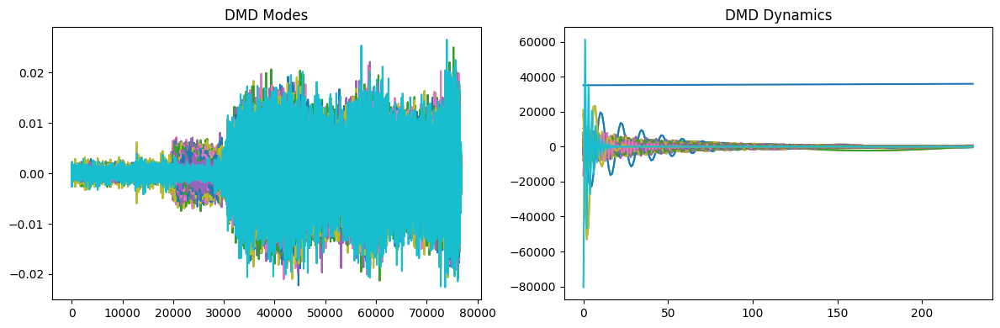

Repetition: 69
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


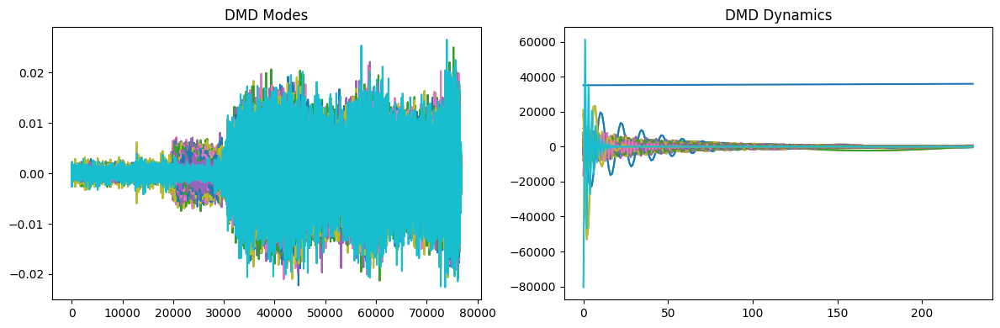

Repetition: 70
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


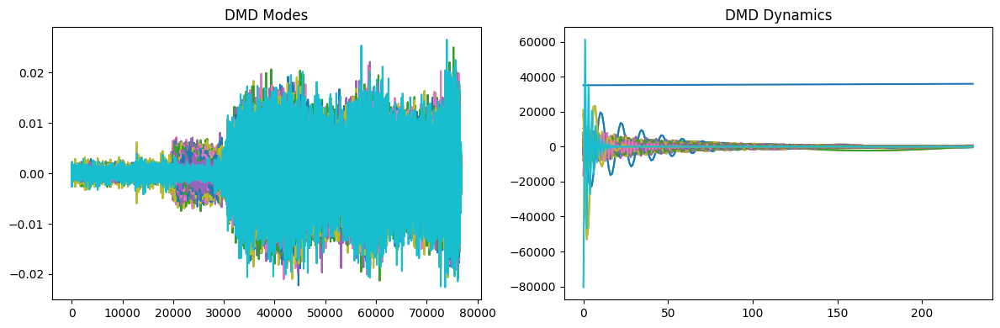

Repetition: 71
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


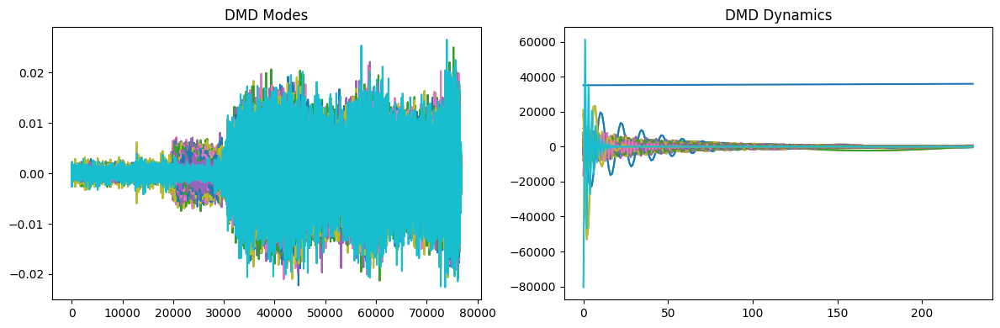

Repetition: 72
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


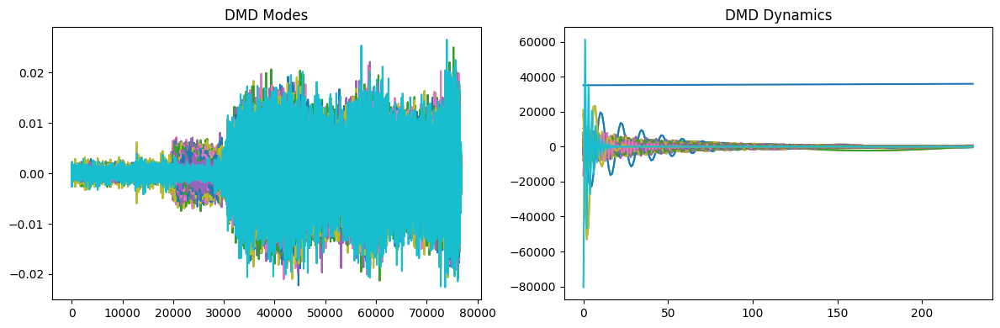

Repetition: 73
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


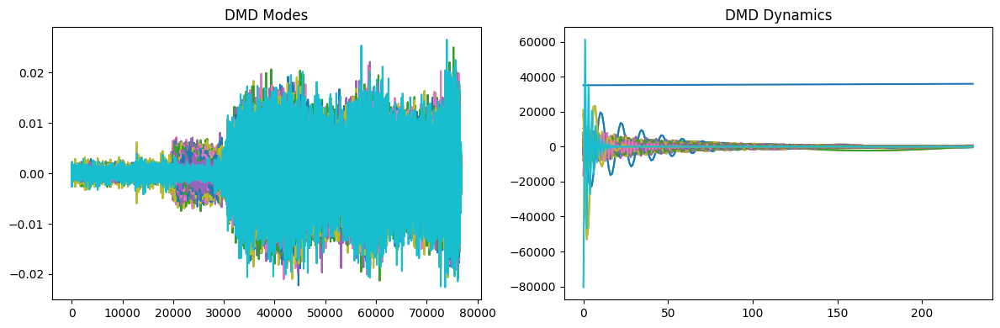

Repetition: 74
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


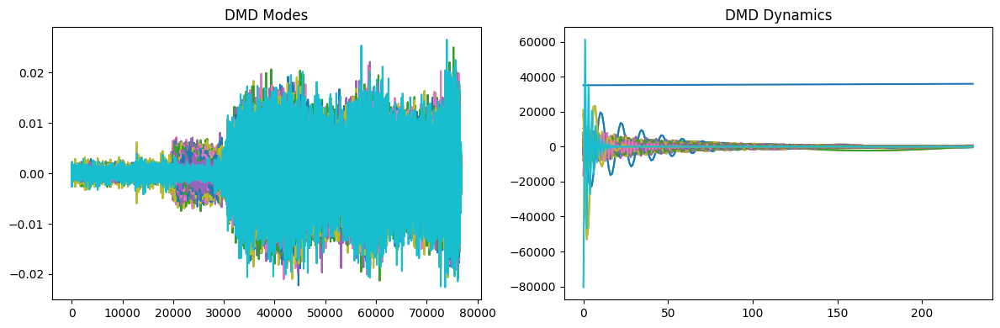

Repetition: 75
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


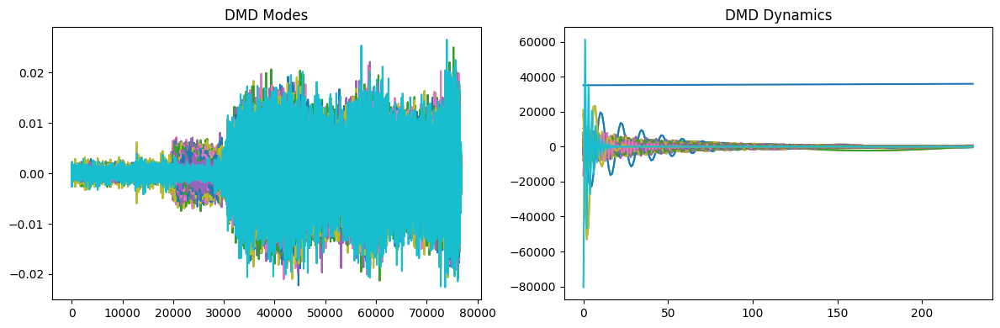

Repetition: 76
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


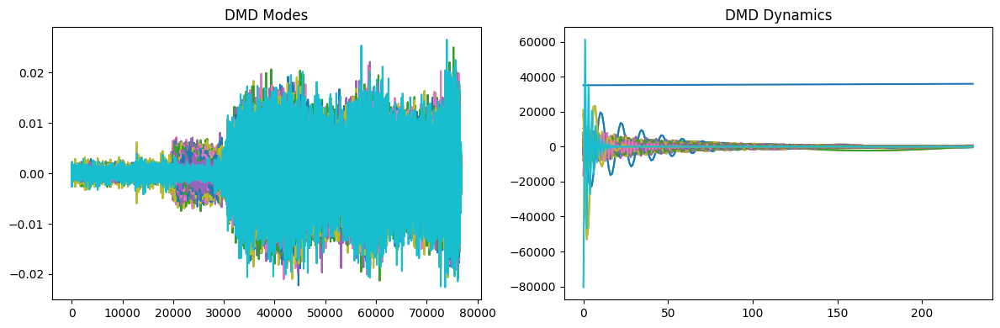

Repetition: 77
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


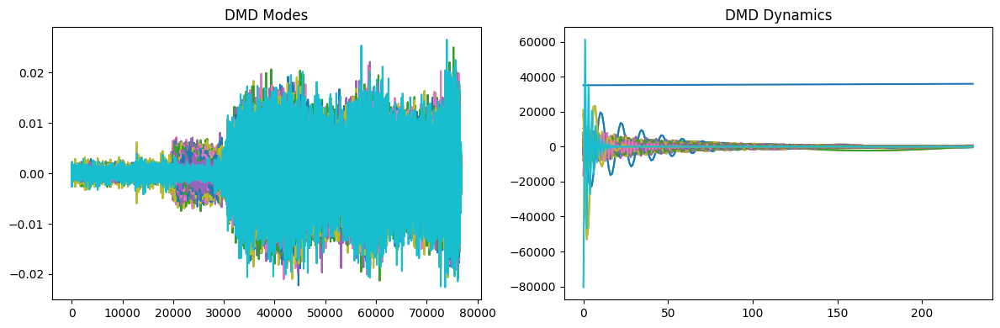

Repetition: 78
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


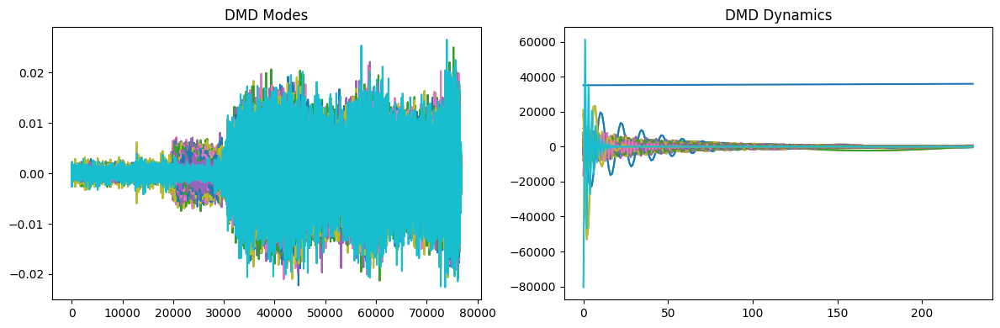

Repetition: 79
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


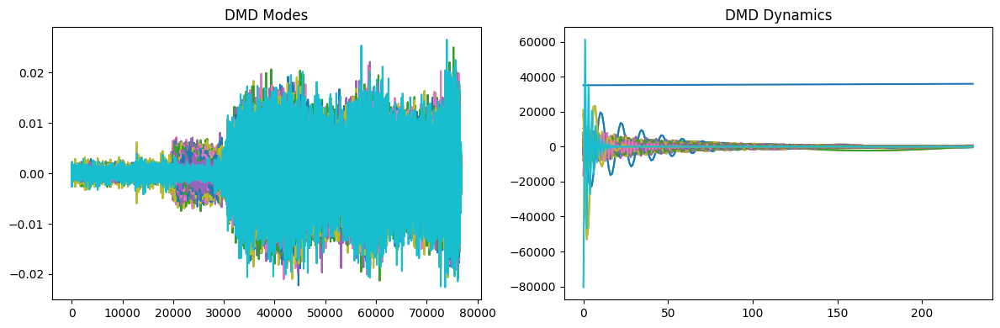

Repetition: 80
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


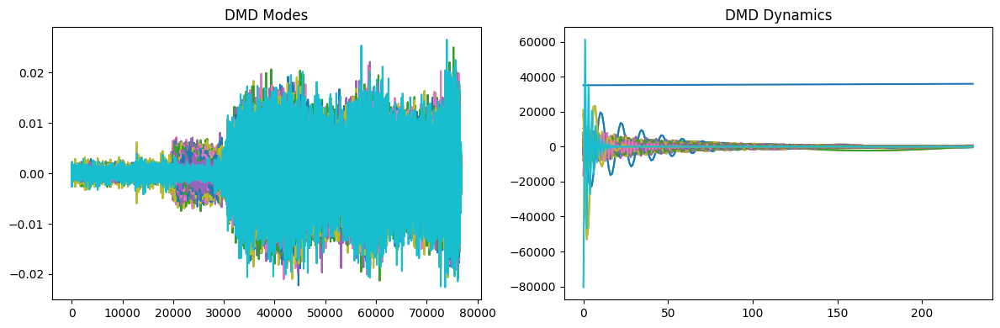

Repetition: 81
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


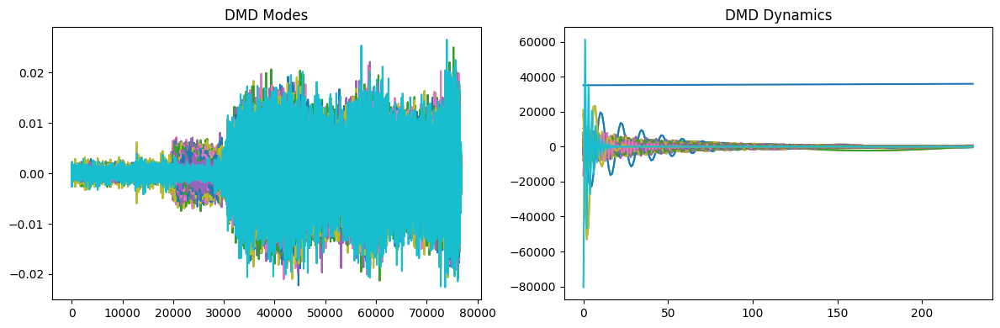

Repetition: 82
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


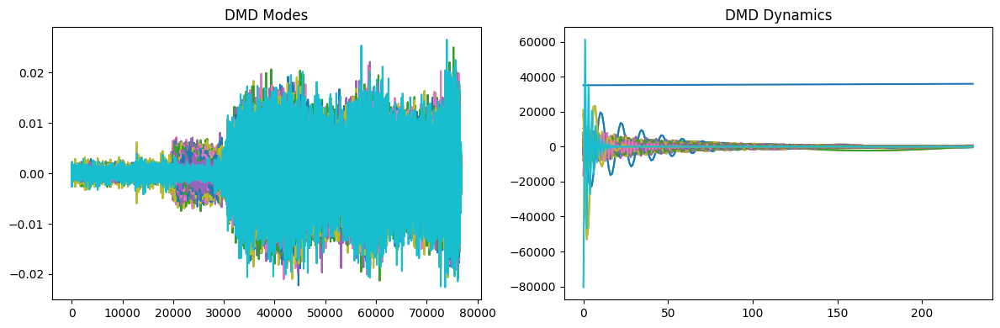

Repetition: 83
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


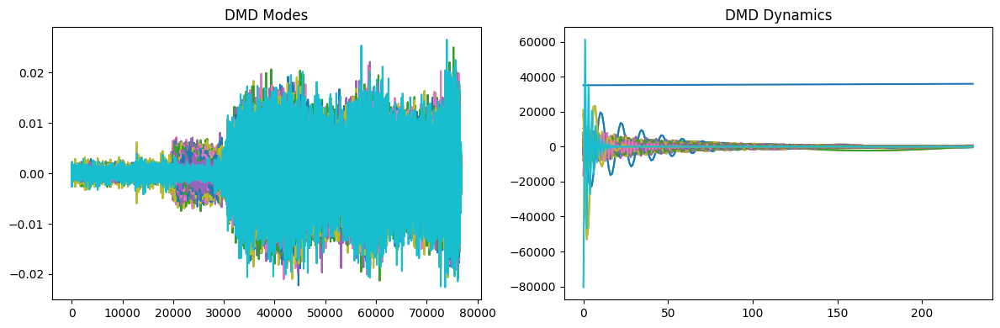

Repetition: 84
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


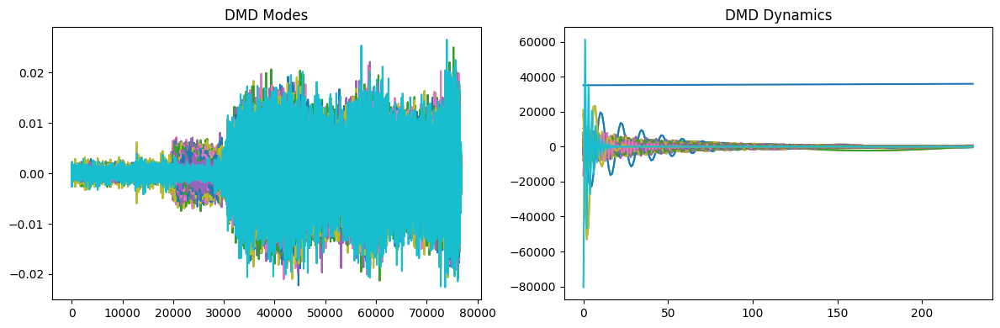

Repetition: 85
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


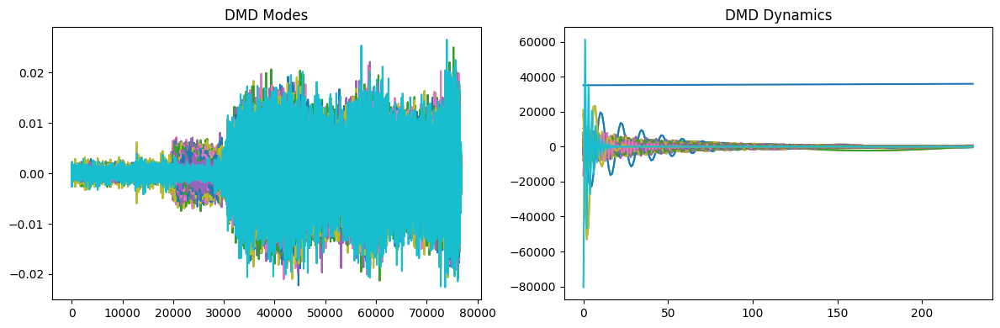

Repetition: 86
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


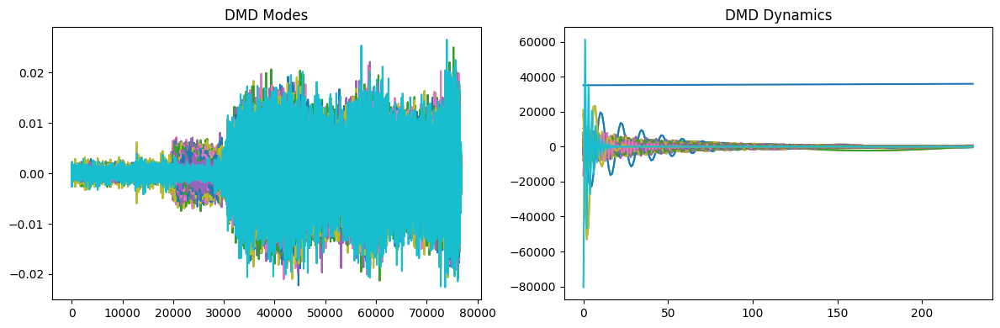

Repetition: 87
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


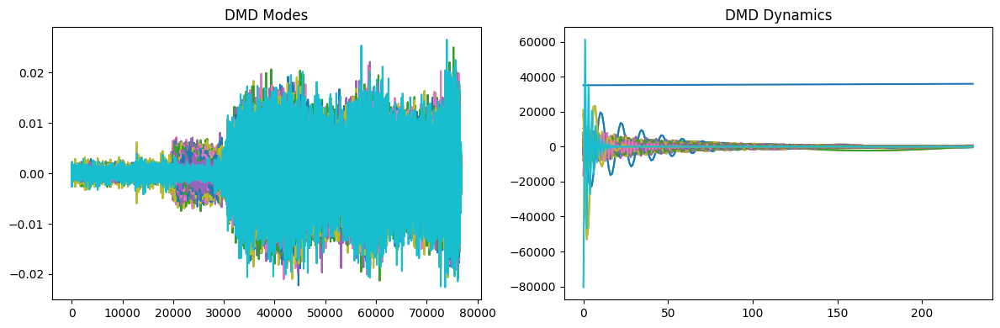

Repetition: 88
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


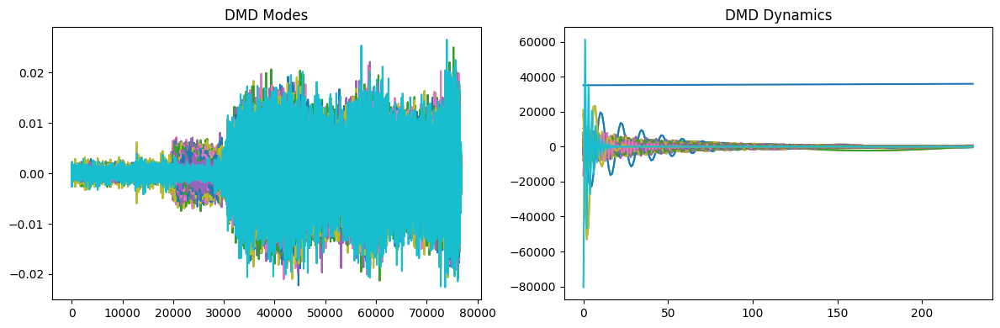

Repetition: 89
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


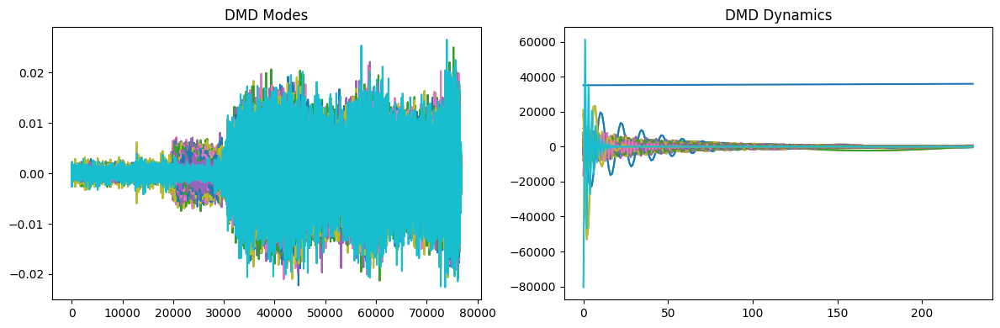

Repetition: 90
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


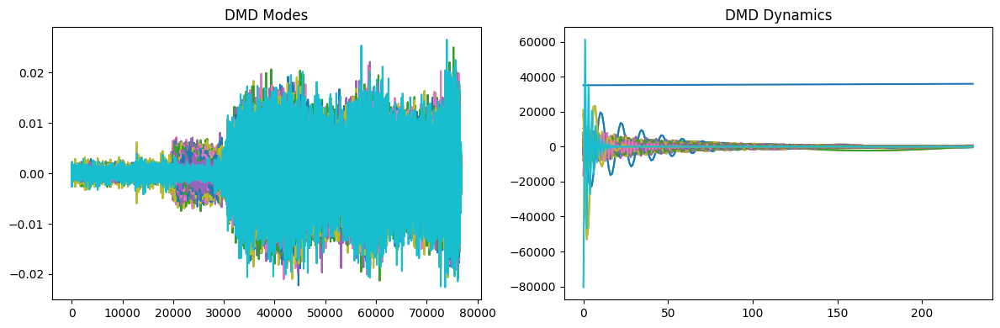

Repetition: 91
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


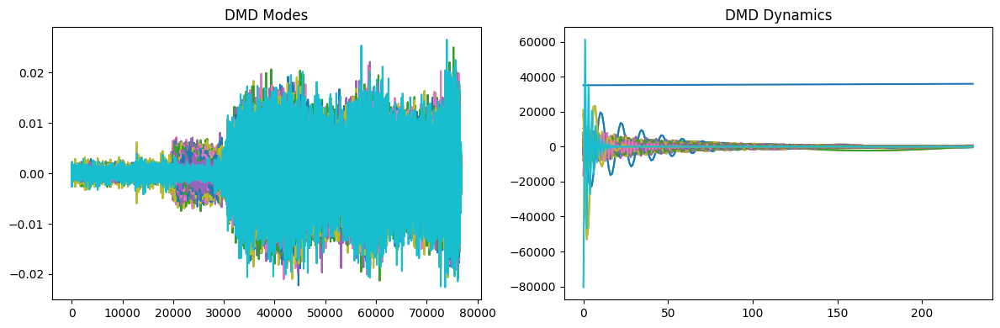

Repetition: 92
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


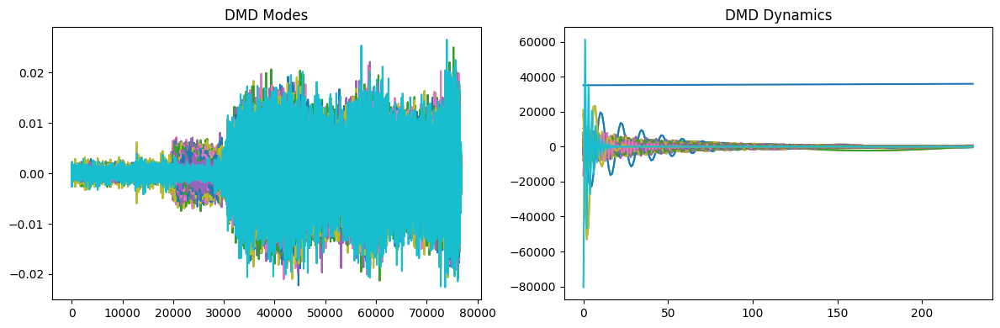

Repetition: 93
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


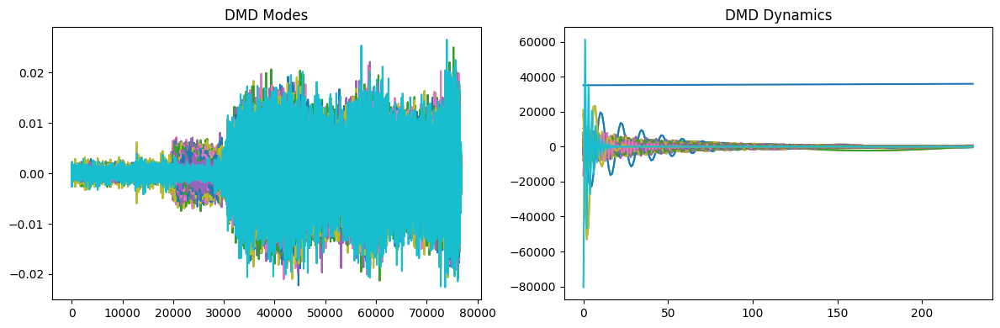

Repetition: 94
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


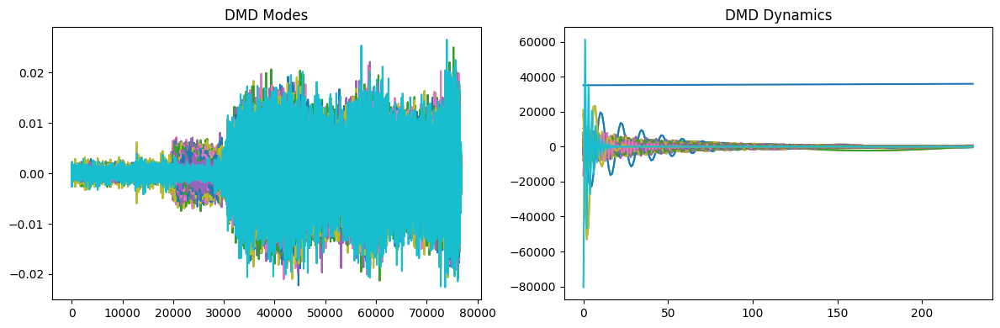

Repetition: 95
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


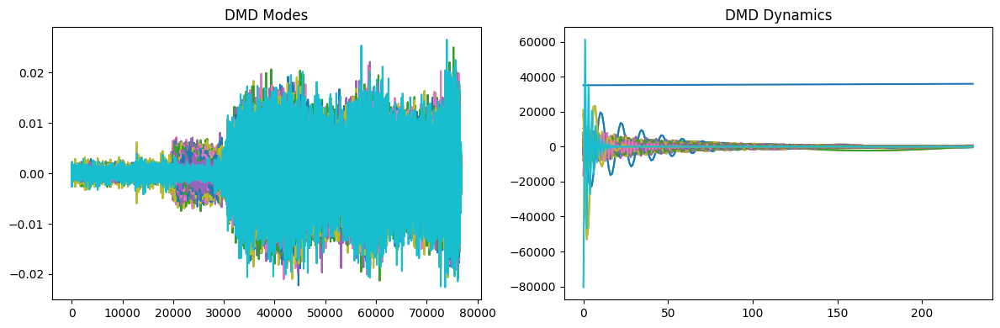

Repetition: 96
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


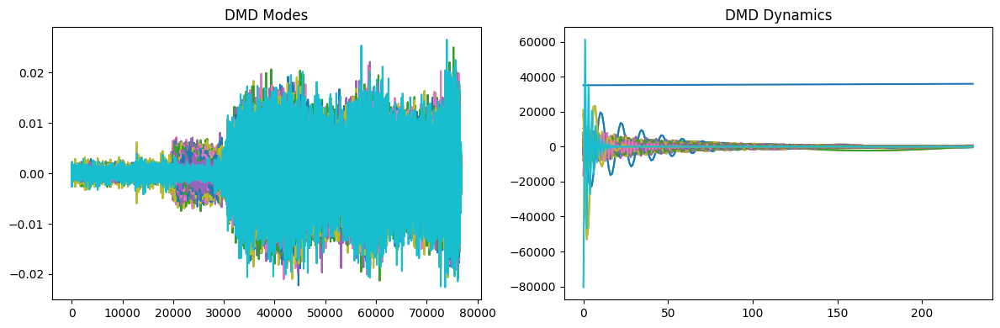

Repetition: 97
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


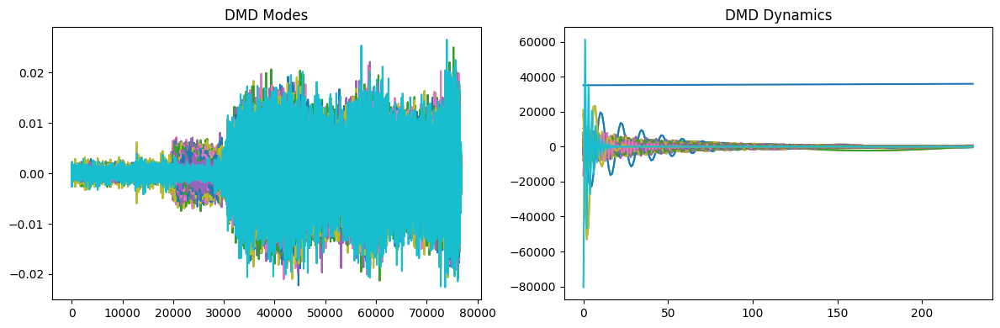

Repetition: 98
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


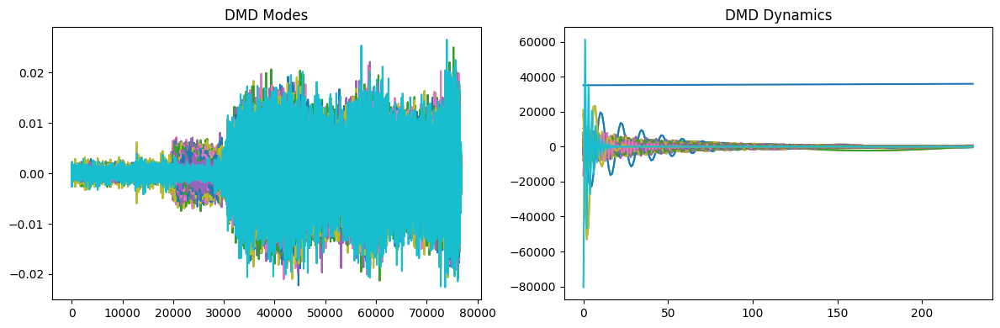

Repetition: 99
[[36 39 39 ...  0 13  0]
 [36 39 39 ...  4  6  0]
 [35 37 37 ...  0  0  0]
 ...
 [42 40 38 ...  0  3  1]
 [42 40 38 ...  0  6  2]
 [42 40 38 ...  1  0  2]]


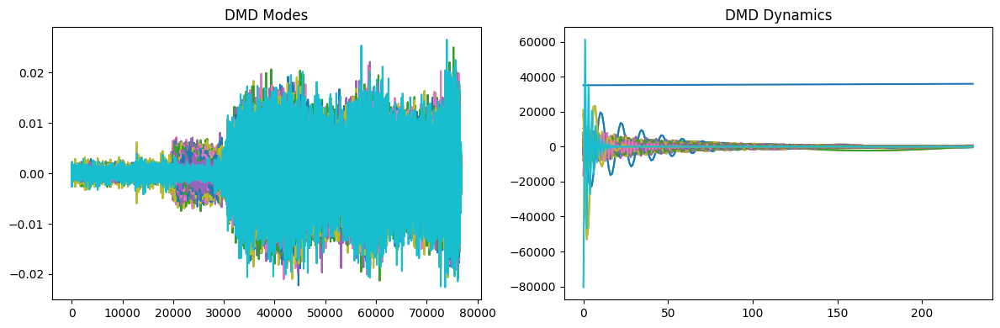

Repetition: 100
Average Execution Time: 34.267840 seconds
time: 57min 11s (started: 2023-09-04 15:05:12 +00:00)


In [ ]:
external_variable_1 = X_flat

# Code block to measure execution time and RAM requirements
code_block = """
# Access the external variables or dependencies here
print(external_variable_1)

Z = X_flat.T

# Perform DMD
pdmd = DMD(svd_rank=231)
pdmd.fit(Z)

# Access DMD modes and dynamics
pmodes = pdmd.modes.T
pdynamics = pdmd.dynamics

# Visualize DMD modes and dynamics
plt.figure(figsize=(12, 4))

# Plot DMD modes
plt.subplot(1, 2, 1)
for mode in pmodes:
    plt.plot(mode)
plt.title('DMD Modes')

# Plot DMD dynamics
plt.subplot(1, 2, 2)
for dynamic in pdynamics:
    plt.plot(dynamic)
plt.title('DMD Dynamics')

plt.tight_layout()
plt.show()
"""

execution_times = []
#memory_usage = []

# Execute the code block 10 times and measure the execution time and RAM requirements
for repetition in range(100):
    process = psutil.Process()
    #process_memory_before = process.memory_info().rss

    # Create a setup statement to define the local namespace with the external variables
    setup_statement = f"from __main__ import external_variable_1"

    # Measure the execution time
    execution_time = timeit.timeit(stmt=code_block, setup=setup_statement, globals=globals(), number=1)

    print("Repetition:", repetition + 1)

    # Store the execution time
    execution_times.append(execution_time)

# Calculate the average execution time and RAM usage
average_execution_time = sum(execution_times) / len(execution_times)
#average_memory_usage = sum(memory_usage) / len(memory_usage)

# Print the average execution time and RAM usage
print("Average Execution Time: {:.6f} seconds".format(average_execution_time))
#print("Average RAM Usage: {:.2f} bytes".format(average_memory_usage))

In [ ]:
external_variable_1 = PC

# Code block to measure execution time and RAM requirements
code_block = """
# Access the external variables or dependencies here
print(external_variable_1)

Z = PC.T

# Perform DMD
pdmd = DMD(svd_rank=231)
pdmd.fit(Z)

# Access DMD modes and dynamics
pmodes = pdmd.modes.T
pdynamics = pdmd.dynamics

# Visualize DMD modes and dynamics
plt.figure(figsize=(12, 4))

# Plot DMD modes
plt.subplot(1, 2, 1)
for mode in pmodes:
    plt.plot(mode)
plt.title('DMD Modes')

# Plot DMD dynamics
plt.subplot(1, 2, 2)
for dynamic in pdynamics:
    plt.plot(dynamic)
plt.title('DMD Dynamics')

plt.tight_layout()
plt.show()
"""

execution_times = []
#memory_usage = []

# Execute the code block 10 times and measure the execution time and RAM requirements
for repetition in range(100):
    process = psutil.Process()
    #process_memory_before = process.memory_info().rss

    # Create a setup statement to define the local namespace with the external variables
    setup_statement = f"from __main__ import external_variable_1"

    # Measure the execution time
    execution_time = timeit.timeit(stmt=code_block, setup=setup_statement, globals=globals(), number=1)

    print("Repetition:", repetition + 1)

    # Store the execution time
    execution_times.append(execution_time)

# Calculate the average execution time and RAM usage
average_execution_time = sum(execution_times) / len(execution_times)
#average_memory_usage = sum(memory_usage) / len(memory_usage)

# Print the average execution time and RAM usage
print("Average Execution Time: {:.6f} seconds".format(average_execution_time))
#print("Average RAM Usage: {:.2f} bytes".format(average_memory_usage))

In [ ]:
external_variable_1 = PC

# Code block to measure execution time and RAM requirements
code_block = """
# Access the external variables or dependencies here
print(external_variable_1)

Z = PC.T

# Perform DMD
pdmd = DMD(svd_rank=198)
pdmd.fit(Z)

# Access DMD modes and dynamics
pmodes = pdmd.modes.T
pdynamics = pdmd.dynamics

# Visualize DMD modes and dynamics
plt.figure(figsize=(12, 4))

# Plot DMD modes
plt.subplot(1, 2, 1)
for mode in pmodes:
    plt.plot(mode)
plt.title('DMD Modes')

# Plot DMD dynamics
plt.subplot(1, 2, 2)
for dynamic in pdynamics:
    plt.plot(dynamic)
plt.title('DMD Dynamics')

plt.tight_layout()
plt.show()
"""

execution_times = []
#memory_usage = []

# Execute the code block 10 times and measure the execution time and RAM requirements
for repetition in range(100):
    process = psutil.Process()
    #process_memory_before = process.memory_info().rss

    # Create a setup statement to define the local namespace with the external variables
    setup_statement = f"from __main__ import external_variable_1"

    # Measure the execution time
    execution_time = timeit.timeit(stmt=code_block, setup=setup_statement, globals=globals(), number=1)

    print("Repetition:", repetition + 1)

    # Store the execution time
    execution_times.append(execution_time)

# Calculate the average execution time and RAM usage
average_execution_time = sum(execution_times) / len(execution_times)
#average_memory_usage = sum(memory_usage) / len(memory_usage)

# Print the average execution time and RAM usage
print("Average Execution Time: {:.6f} seconds".format(average_execution_time))
#print("Average RAM Usage: {:.2f} bytes".format(average_memory_usage))

In [ ]:
external_variable_1 = PC

# Code block to measure execution time and RAM requirements
code_block = """
# Access the external variables or dependencies here
print(external_variable_1)

Z = PC.T

# Perform DMD
pdmd = DMD(svd_rank=128)
pdmd.fit(Z)

# Access DMD modes and dynamics
pmodes = pdmd.modes.T
pdynamics = pdmd.dynamics

# Visualize DMD modes and dynamics
plt.figure(figsize=(12, 4))

# Plot DMD modes
plt.subplot(1, 2, 1)
for mode in pmodes:
    plt.plot(mode)
plt.title('DMD Modes')

# Plot DMD dynamics
plt.subplot(1, 2, 2)
for dynamic in pdynamics:
    plt.plot(dynamic)
plt.title('DMD Dynamics')

plt.tight_layout()
plt.show()
"""

execution_times = []
#memory_usage = []

# Execute the code block 10 times and measure the execution time and RAM requirements
for repetition in range(100):
    process = psutil.Process()
    #process_memory_before = process.memory_info().rss

    # Create a setup statement to define the local namespace with the external variables
    setup_statement = f"from __main__ import external_variable_1"

    # Measure the execution time
    execution_time = timeit.timeit(stmt=code_block, setup=setup_statement, globals=globals(), number=1)

    print("Repetition:", repetition + 1)

    # Store the execution time
    execution_times.append(execution_time)

# Calculate the average execution time and RAM usage
average_execution_time = sum(execution_times) / len(execution_times)
#average_memory_usage = sum(memory_usage) / len(memory_usage)

# Print the average execution time and RAM usage
print("Average Execution Time: {:.6f} seconds".format(average_execution_time))
#print("Average RAM Usage: {:.2f} bytes".format(average_memory_usage))

In [ ]:
external_variable_1 = PC

# Code block to measure execution time and RAM requirements
code_block = """
# Access the external variables or dependencies here
print(external_variable_1)

Z = PC.T

# Perform DMD
pdmd = DMD(svd_rank=93)
pdmd.fit(Z)

# Access DMD modes and dynamics
pmodes = pdmd.modes.T
pdynamics = pdmd.dynamics

# Visualize DMD modes and dynamics
plt.figure(figsize=(12, 4))

# Plot DMD modes
plt.subplot(1, 2, 1)
for mode in pmodes:
    plt.plot(mode)
plt.title('DMD Modes')

# Plot DMD dynamics
plt.subplot(1, 2, 2)
for dynamic in pdynamics:
    plt.plot(dynamic)
plt.title('DMD Dynamics')

plt.tight_layout()
plt.show()
"""

execution_times = []
#memory_usage = []

# Execute the code block 10 times and measure the execution time and RAM requirements
for repetition in range(100):
    process = psutil.Process()
    #process_memory_before = process.memory_info().rss

    # Create a setup statement to define the local namespace with the external variables
    setup_statement = f"from __main__ import external_variable_1"

    # Measure the execution time
    execution_time = timeit.timeit(stmt=code_block, setup=setup_statement, globals=globals(), number=1)

    print("Repetition:", repetition + 1)

    # Store the execution time
    execution_times.append(execution_time)

# Calculate the average execution time and RAM usage
average_execution_time = sum(execution_times) / len(execution_times)
#average_memory_usage = sum(memory_usage) / len(memory_usage)

# Print the average execution time and RAM usage
print("Average Execution Time: {:.6f} seconds".format(average_execution_time))
#print("Average RAM Usage: {:.2f} bytes".format(average_memory_usage))

In [ ]:
X_size_bytes = sys.getsizeof(X_flat)

# Convert bytes to megabytes
X_size_kilobytes = X_size_bytes / 1024

print(f"Array size: {X_size_kilobytes:.2f} KB")

Array size: 17325.12 KB
time: 12.9 ms (started: 2023-09-04 16:58:21 +00:00)


In [ ]:
PC_size_bytes = sys.getsizeof(PC)

# Convert bytes to megabytes
PC_size_kilobytes = PC_size_bytes / 1024

print(f"Array size: {PC_size_kilobytes:.2f} KB")

Array size: 0.12 KB
time: 960 µs (started: 2023-09-04 16:59:28 +00:00)


In [ ]:
PC_size_bytes = sys.getsizeof(PC)

# Convert bytes to megabytes
PC_size_kilobytes = PC_size_bytes

print(f"Array size: {PC_size_kilobytes:.2f} KB")

Array size: 128.00 KB
time: 1.09 ms (started: 2023-09-04 17:00:43 +00:00)
